In [1]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#Lab Encoder
from sklearn.preprocessing import LabelEncoder

#Divide Dataset
from sklearn.model_selection import train_test_split, cross_val_score

#Transform features
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, RobustScaler, OneHotEncoder, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline



#KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Naive Bayes Classifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB

# Decision Tree
from sklearn.tree import DecisionTreeClassifier

# RandomForest
from sklearn.ensemble import RandomForestClassifier

#Gradient Boosting
from sklearn.ensemble import GradientBoostingClassifier

# SVM transformed not tuning
from sklearn.svm import SVC


In [2]:
df = pd.read_csv("Dataset_Project_ML.csv")

#Initial dataset
display(df.head())
print("Shape of data: {}".format(df.shape))
list(df)

,Marital_status,Appli_mode,Appl_order,Course,Day/evening_attendance,Previous_qualific,Nacionality,Mothers_qualifi,Fathers_qualifi,Mothers_occup,...,units_Snd_s(credited),units_Snd_s(enrolled),units_Snd_s(evaluations),units_Snd_s(approved),units_Snd_s(grade),units_Snd_s(without_evaluations),Unemployment_rate,Inflation_rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,14,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13,0,13.9,-0.3,0.79,Graduate


Shape of data: (4424, 35)


['Marital_status',
 'Appli_mode',
 'Appl_order',
 'Course',
 'Day/evening_attendance',
 'Previous_qualific',
 'Nacionality',
 'Mothers_qualifi',
 'Fathers_qualifi',
 'Mothers_occup',
 'Fathers_occup',
 'Displaced',
 'Educational_needs',
 'Debtor',
 'Tuition_fees_uptodate',
 'Gender',
 'Scholarship_holder',
 'Age_at_enroll',
 'International',
 'units_Fst_s(credited)',
 'units_Fst_s(enrolled)',
 'units_Fst_s(evaluations)',
 'units_Fst_s(approved)',
 'units_Fst_s(grade)',
 'units_Fst_s(without_evaluations)',
 'units_Snd_s(credited)',
 'units_Snd_s(enrolled)',
 'units_Snd_s(evaluations)',
 'units_Snd_s(approved)',
 'units_Snd_s(grade)',
 'units_Snd_s(without_evaluations)',
 'Unemployment_rate',
 'Inflation_rate',
 'GDP',
 'Target']

In [3]:
#Picking the Predicted and Response Variable(s). 
pedicted_variables=list(df)[0:34]
response=list(df)[34]
Pred_Var=df[pedicted_variables]
Resp_Var=df[response]

print("\n\nPredicted Variables:\n", Pred_Var)
print("\n\nResponse Variable:\n", Resp_Var)



Predicted Variables:
       Marital_status  Appli_mode  Appl_order  Course  Day/evening_attendance  \
0                  1           8           5       2                       1   
1                  1           6           1      11                       1   
2                  1           1           5       5                       1   
3                  1           8           2      15                       1   
4                  2          12           1       3                       0   
...              ...         ...         ...     ...                     ...   
4419               1           1           6      15                       1   
4420               1           1           2      15                       1   
4421               1           1           1      12                       1   
4422               1           1           1       9                       1   
4423               1           5           1      15                       1   

      Previous_

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

#Demographic Variables
demographic_var = ['Marital_status', 'Nacionality', 'Displaced', 'Gender', 'Age_at_enroll', 'International']
display(df[demographic_var].describe().round(2))

#Socioeconomic Variables
socioeconomic_var = ['Mothers_qualifi','Fathers_qualifi','Mothers_occup','Fathers_occup',
                     'Educational_needs','Debtor','Tuition_fees_uptodate','Scholarship_holder']
display(df[socioeconomic_var].describe().round(2))

#Macroeconomic data
Macroeconomic_data =['Unemployment_rate','Inflation_rate','GDP']
display(df[Macroeconomic_data].describe().round(2))

#Academic Data at enrollment
Academic_data_at_enrollment =['Appli_mode','Appl_order','Course','Day/evening_attendance',
                              'Previous_qualific']
display(df[Academic_data_at_enrollment].describe().round(2))

#Academic data at the end of 1st semester
Academic_data_at_the_end_of_First_semester=['units_Fst_s(credited)','units_Fst_s(enrolled)',
                                            'units_Fst_s(evaluations)','units_Fst_s(approved)',
                                            'units_Fst_s(grade)','units_Fst_s(without_evaluations)']
display(df[Academic_data_at_the_end_of_First_semester].describe().round(2))

#Academic data at the end of 2nd semester
Academic_data_at_the_end_of_Snd_semester=['units_Snd_s(credited)','units_Snd_s(enrolled)',
                                          'units_Snd_s(evaluations)','units_Snd_s(approved)',
                                          'units_Snd_s(grade)','units_Snd_s(without_evaluations)']
display(df[Academic_data_at_the_end_of_Snd_semester].describe().round(2))


,Marital_status,Nacionality,Displaced,Gender,Age_at_enroll,International
count,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00
mean,1.18,1.25,0.55,0.35,23.27,0.02
std,0.61,1.75,0.50,0.48,7.59,0.16
min,1.00,1.00,0.00,0.00,17.00,0.00
25%,1.00,1.00,0.00,0.00,19.00,0.00
50%,1.00,1.00,1.00,0.00,20.00,0.00
75%,1.00,1.00,1.00,1.00,25.00,0.00
max,6.00,21.00,1.00,1.00,70.00,1.00


,Mothers_qualifi,Fathers_qualifi,Mothers_occup,Fathers_occup,Educational_needs,Debtor,Tuition_fees_uptodate,Scholarship_holder
count,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00
mean,12.32,16.46,7.32,7.82,0.01,0.11,0.88,0.25
std,9.03,11.04,4.00,4.86,0.11,0.32,0.32,0.43
min,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00
25%,2.00,3.00,5.00,5.00,0.00,0.00,1.00,0.00
50%,13.00,14.00,6.00,8.00,0.00,0.00,1.00,0.00
75%,22.00,27.00,10.00,10.00,0.00,0.00,1.00,0.00
max,29.00,34.00,32.00,46.00,1.00,1.00,1.00,1.00


,Unemployment_rate,Inflation_rate,GDP
count,4424.00,4424.00,4424.00
mean,11.57,1.23,0.00
std,2.66,1.38,2.27
min,7.60,-0.80,-4.06
25%,9.40,0.30,-1.70
50%,11.10,1.40,0.32
75%,13.90,2.60,1.79
max,16.20,3.70,3.51


,Appli_mode,Appl_order,Course,Day/evening_attendance,Previous_qualific
count,4424.00,4424.00,4424.00,4424.00,4424.00
mean,6.89,1.73,9.90,0.89,2.53
std,5.30,1.31,4.33,0.31,3.96
min,1.00,0.00,1.00,0.00,1.00
25%,1.00,1.00,6.00,1.00,1.00
50%,8.00,1.00,10.00,1.00,1.00
75%,12.00,2.00,13.00,1.00,1.00
max,18.00,9.00,17.00,1.00,17.00


,units_Fst_s(credited),units_Fst_s(enrolled),units_Fst_s(evaluations),units_Fst_s(approved),units_Fst_s(grade),units_Fst_s(without_evaluations)
count,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00
mean,0.71,6.27,8.30,4.71,10.68,0.14
std,2.36,2.48,4.18,3.09,4.86,0.69
min,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,5.00,6.00,3.00,11.00,0.00
50%,0.00,6.00,8.00,5.00,12.00,0.00
75%,0.00,7.00,10.00,6.00,13.00,0.00
max,20.00,26.00,45.00,26.00,19.00,12.00


,units_Snd_s(credited),units_Snd_s(enrolled),units_Snd_s(evaluations),units_Snd_s(approved),units_Snd_s(grade),units_Snd_s(without_evaluations)
count,4424.00,4424.00,4424.00,4424.00,4424.00,4424.00
mean,0.54,6.23,8.06,4.44,10.27,0.15
std,1.92,2.20,3.95,3.01,5.23,0.75
min,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,5.00,6.00,2.00,11.00,0.00
50%,0.00,6.00,8.00,5.00,12.00,0.00
75%,0.00,7.00,10.00,6.00,13.00,0.00
max,19.00,23.00,33.00,20.00,19.00,12.00


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

demographic_var_df= df['Marital_status']


In [6]:
df.dtypes


Marital_status                        int64
Appli_mode                            int64
Appl_order                            int64
Course                                int64
Day/evening_attendance                int64
Previous_qualific                     int64
Nacionality                           int64
Mothers_qualifi                       int64
Fathers_qualifi                       int64
Mothers_occup                         int64
Fathers_occup                         int64
Displaced                             int64
Educational_needs                     int64
Debtor                                int64
Tuition_fees_uptodate                 int64
Gender                                int64
Scholarship_holder                    int64
Age_at_enroll                         int64
International                         int64
units_Fst_s(credited)                 int64
units_Fst_s(enrolled)                 int64
units_Fst_s(evaluations)              int64
units_Fst_s(approved)           

In [7]:
#for col in df:
    #df[col].value_counts().sort_index().plot(kind='bar', rot=0, ylabel='count')
    #plt.show()

<Axes: title={'center': 'Age_at_enroll'}, xlabel='Target'>

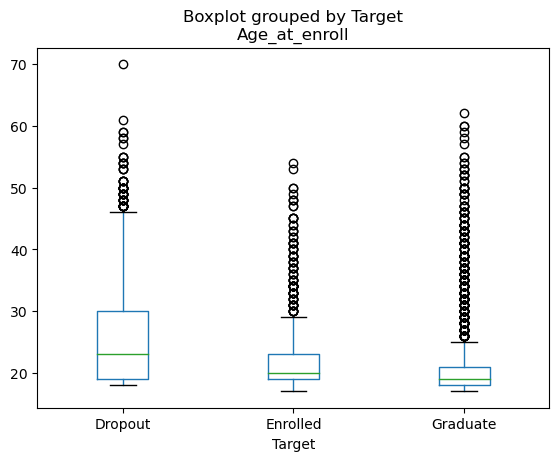

In [8]:
df.boxplot(by ='Target', column =['Age_at_enroll'], grid = False) 

Text(0.5, 0, 'Marital status')

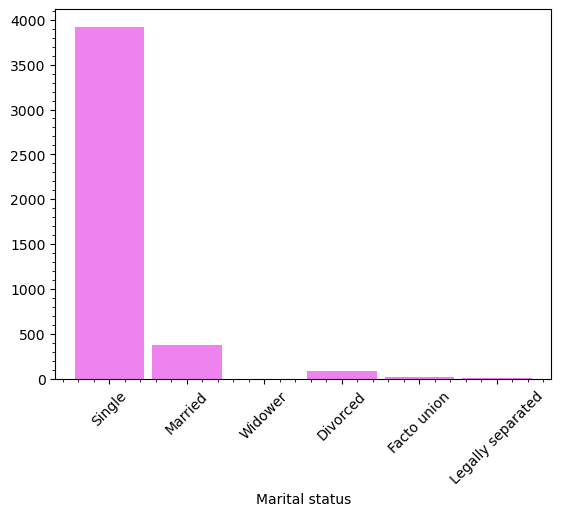

In [9]:
categories_MS = ['Single', 'Married', 'Widower', 'Divorced', 'Facto union', 'Legally separated' ]
df['Marital_status'].value_counts().sort_index().plot(kind='bar',color=['violet'],width=0.9, grid = False)#)#, color=['violet', 'orange', 'slategray', 'goldenrod','darkslategray', 'deeppink'], width=0.9)
plt.xticks(np.arange(6),categories_MS, rotation=45)
plt.minorticks_on()
plt.xlabel('Marital status')
#plt.grid(which='major', linestyle=':', linewidth='0.5', color='black')


(3,)
Graduate    2209
Dropout     1421
Enrolled     794
Name: Target, dtype: int64


<BarContainer object of 3 artists>

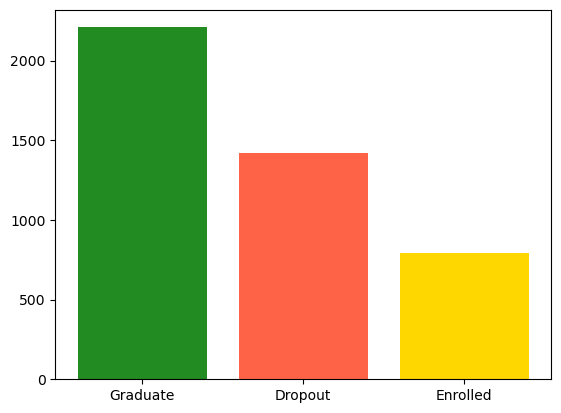

In [10]:
t= df['Target'].value_counts()
print(t.shape)
print(t)
Target_names = ['Graduate', 'Dropout', 'Enrolled']
plt.bar(Target_names,t,color=['forestgreen','Tomato','gold'])


<BarContainer object of 17 artists>

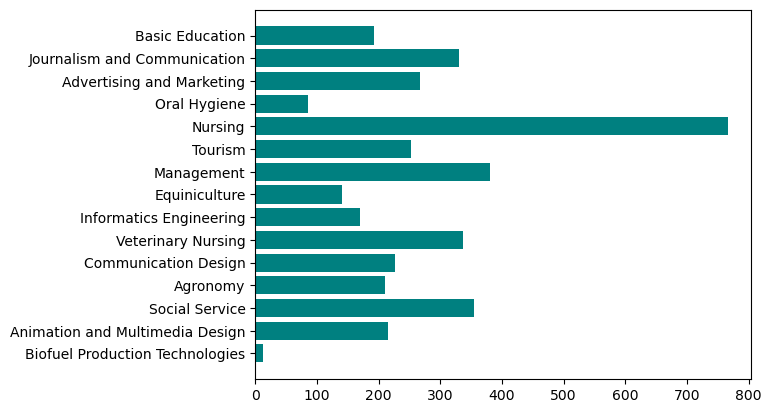

In [11]:
#ax.hist(data, bins=25, edgecolor='black')
Courses = ['Biofuel Production Technologies', 'Animation and Multimedia Design', 'Social Service',\
                 'Agronomy', 'Communication Design', 'Veterinary Nursing', 'Informatics Engineering', 'Equiniculture',\
                 'Management', 'Social Service', 'Tourism','Nursing','Oral Hygiene','Advertising and Marketing',\
                'Journalism and Communication', 'Basic Education','Management']
x= df['Course'].value_counts().sort_index()
x
plt.barh(Courses,x,color=['Teal'])

<Axes: >

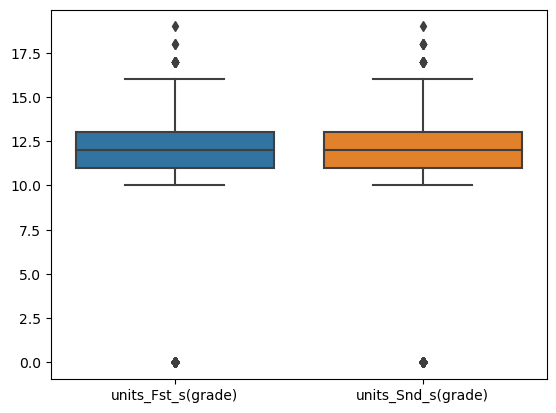

In [12]:
Grades= df[['units_Fst_s(grade)','units_Snd_s(grade)']]
Grades
import seaborn as sns
sns.boxplot(data=Grades)

Text(0.5, 0, 'Marital status')

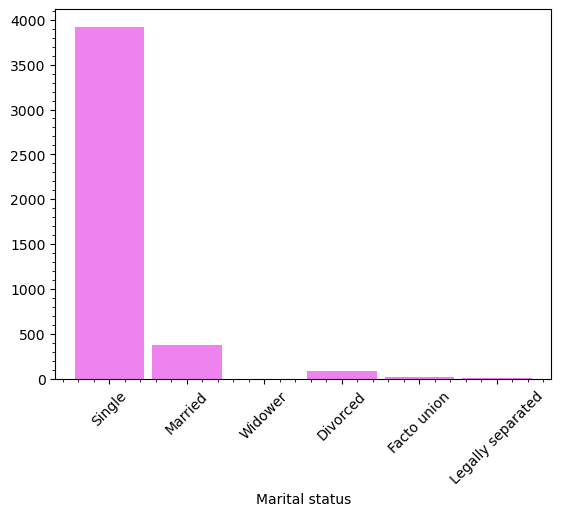

In [13]:
categories_MS = ['Single', 'Married', 'Widower', 'Divorced', 'Facto union', 'Legally separated' ]
df['Marital_status'].value_counts().sort_index().plot(kind='bar',color=['violet'],width=0.9, grid = False)#)#, color=['violet', 'orange', 'slategray', 'goldenrod','darkslategray', 'deeppink'], width=0.9)
plt.xticks(np.arange(6),categories_MS, rotation=45)
plt.minorticks_on()
plt.xlabel('Marital status')

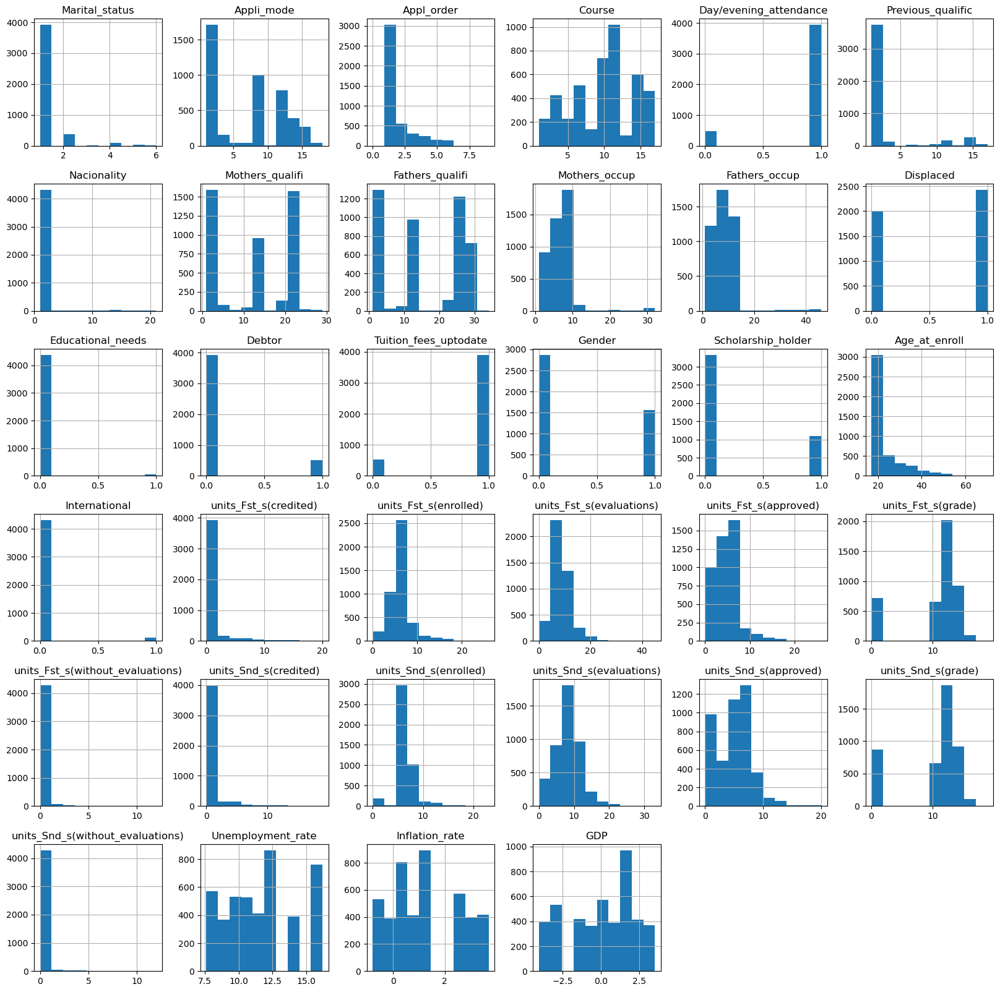

In [14]:
df.hist(figsize = (20 , 20))
plt.show()

In [15]:
#Converting Target into numeric
import pandas as pd
target2 = {'Dropout': 0, 'Graduate': 1, 'Enrolled': 2}

df['Target2'] = df['Target'].map(target2)

print("\nConverted Target:\n")
print(df[['Target', 'Target2']])
#df['Target2'].dtype()


Converted Target:

        Target  Target2
0      Dropout        0
1     Graduate        1
2      Dropout        0
3     Graduate        1
4     Graduate        1
...        ...      ...
4419  Graduate        1
4420   Dropout        0
4421   Dropout        0
4422  Graduate        1
4423  Graduate        1

[4424 rows x 2 columns]


### Prepare training and test datasets

In [16]:
#Replacing Traget for New Target2m and re-definying the predicted variable and the response
df1 = df.drop(columns=['Target']) 

predicted_variables=list(df1)[0:34]
response=list(df1)[34]

Pred_Var1=df1[pedicted_variables]
Resp_Var1=df1[response]


In [17]:
#pip install -U scikit-learn

In [18]:
#Splitting data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
Pred_Var1, Resp_Var1, random_state=0)
print("X_test: {}".format(X_test.shape))
print("y_test: {}".format(y_test.shape))
print("X_train shape: {}".format(X_train.shape))
print("y_train shape: {}".format(y_train.shape))

X_test: (1106, 34)
y_test: (1106,)
X_train shape: (3318, 34)
y_train shape: (3318,)


### Create pridction models

In [19]:
#KNN
import numpy as np

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

n_neighbors_values = list(range(1, 20))
train_accuracies = []
test_accuracies = []

# Loop over each value of n_neighbors and compute accuracies
for n_neighbors in n_neighbors_values:
    Knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    Knn.fit(X_train, y_train)
    
    y_pred_train = Knn.predict(X_train)
    accuracy_train = accuracy_score(y_train, y_pred_train)
    train_accuracies.append(accuracy_train)
    
    y_pred_test = Knn.predict(X_test)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    test_accuracies.append(accuracy_test)
    
    print(f"n_neighbors={n_neighbors}, Accuracy train = {accuracy_train:.3f}, Accuracy test = {accuracy_test:.3f}")

n_neighbors=1, Accuracy train = 1.000, Accuracy test = 0.626
n_neighbors=2, Accuracy train = 0.823, Accuracy test = 0.649
n_neighbors=3, Accuracy train = 0.806, Accuracy test = 0.668
n_neighbors=4, Accuracy train = 0.785, Accuracy test = 0.680
n_neighbors=5, Accuracy train = 0.766, Accuracy test = 0.680
n_neighbors=6, Accuracy train = 0.764, Accuracy test = 0.689
n_neighbors=7, Accuracy train = 0.748, Accuracy test = 0.697
n_neighbors=8, Accuracy train = 0.745, Accuracy test = 0.692
n_neighbors=9, Accuracy train = 0.739, Accuracy test = 0.703
n_neighbors=10, Accuracy train = 0.732, Accuracy test = 0.704
n_neighbors=11, Accuracy train = 0.729, Accuracy test = 0.700
n_neighbors=12, Accuracy train = 0.719, Accuracy test = 0.706
n_neighbors=13, Accuracy train = 0.717, Accuracy test = 0.701
n_neighbors=14, Accuracy train = 0.715, Accuracy test = 0.699
n_neighbors=15, Accuracy train = 0.710, Accuracy test = 0.702
n_neighbors=16, Accuracy train = 0.709, Accuracy test = 0.703
n_neighbors=17, A

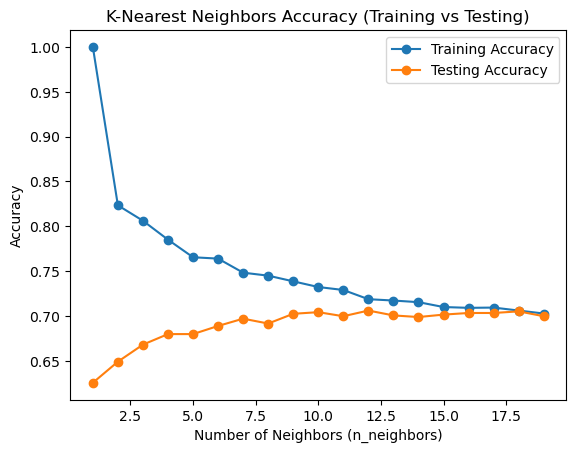

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Plotting the results
fig, ax = plt.subplots()

ax.plot(n_neighbors_values, train_accuracies, label="Training Accuracy", marker='o')
ax.plot(n_neighbors_values, test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Number of Neighbors (n_neighbors)')
ax.set_ylabel('Accuracy')
ax.set_title('K-Nearest Neighbors Accuracy (Training vs Testing)')
ax.legend()

plt.show()

In [21]:
# Naive Bayes Classifier
from sklearn.naive_bayes import GaussianNB
NB = GaussianNB()
brn = BernoulliNB()

NB.fit(X_train, y_train)

print("GBN Train set score: {:.2f}".format(NB.score(X_train, y_train)))
print("GBN Test set score: {:.2f}".format(NB.score(X_test, y_test)))

brn.fit(X_train, y_train)
print("BRN Train set score: {:.2f}".format(brn.score(X_train, y_train)))
print("BRN Test set score: {:.2f}".format(brn.score(X_test, y_test)))

GBN Train set score: 0.68
GBN Test set score: 0.67
BRN Train set score: 0.68
BRN Test set score: 0.69


In [130]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

max_depth_values = list(range(5, 10))
min_samples_split_values = list(range(2, 10))
train_accuracies = []
test_accuracies = []



# Loop over each value of n_neighbors and compute accuracies
for max_depth in max_depth_values:
    for min_samples_split in min_samples_split_values:
            tree = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split)
            tree.fit(X_train, y_train)
            
            y_pred_train = tree.predict(X_train)
            accuracy_train = accuracy_score(y_train, y_pred_train)
            train_accuracies.append(accuracy_train)
    
            y_pred_test = tree.predict(X_test)
            accuracy_test = accuracy_score(y_test, y_pred_test)
            test_accuracies.append(accuracy_test)
    
            print(f"max_depth={max_depth}, min_samples_split={min_samples_split}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")

    

max_depth=5, min_samples_split=2, Train Accuracy = 0.762, Test Accuracy = 0.738
max_depth=5, min_samples_split=3, Train Accuracy = 0.762, Test Accuracy = 0.740
max_depth=5, min_samples_split=4, Train Accuracy = 0.762, Test Accuracy = 0.739
max_depth=5, min_samples_split=5, Train Accuracy = 0.762, Test Accuracy = 0.739
max_depth=5, min_samples_split=6, Train Accuracy = 0.762, Test Accuracy = 0.741
max_depth=5, min_samples_split=7, Train Accuracy = 0.762, Test Accuracy = 0.740
max_depth=5, min_samples_split=8, Train Accuracy = 0.762, Test Accuracy = 0.739
max_depth=5, min_samples_split=9, Train Accuracy = 0.762, Test Accuracy = 0.739
max_depth=6, min_samples_split=2, Train Accuracy = 0.784, Test Accuracy = 0.754
max_depth=6, min_samples_split=3, Train Accuracy = 0.784, Test Accuracy = 0.753
max_depth=6, min_samples_split=4, Train Accuracy = 0.784, Test Accuracy = 0.755
max_depth=6, min_samples_split=5, Train Accuracy = 0.784, Test Accuracy = 0.750
max_depth=6, min_samples_split=6, Train 

Text(0.5, 1.0, 'Heatmap of Train Decision Tree Training')

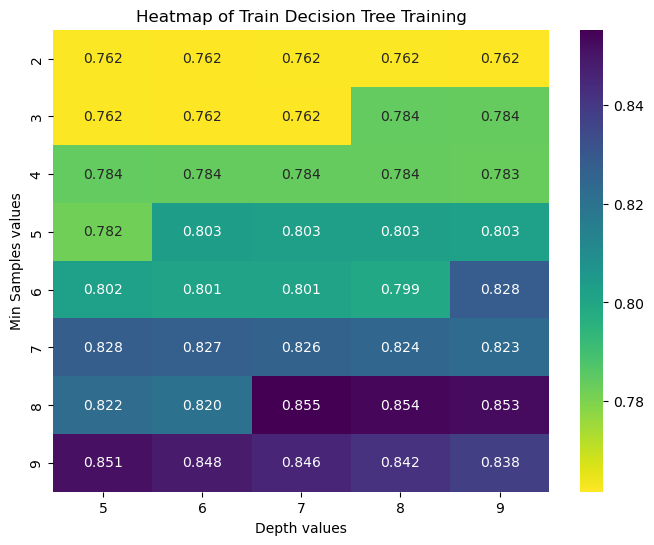

In [131]:
z = np.array(train_accuracies)
X,Y = np.meshgrid(max_depth_values,min_samples_split_values)

Z=z.reshape(len(min_samples_split_values),len(max_depth_values))

plt.figure(figsize=(8, 6))
sns.heatmap(Z, xticklabels=max_depth_values, yticklabels=min_samples_split_values, annot=True, fmt=".3f", cmap='viridis_r')
plt.xlabel('Depth values')
plt.ylabel('Min Samples values')
plt.title('Heatmap of Train Decision Tree Training')

Text(0.5, 1.0, 'Heatmap of Test Decision Tree')

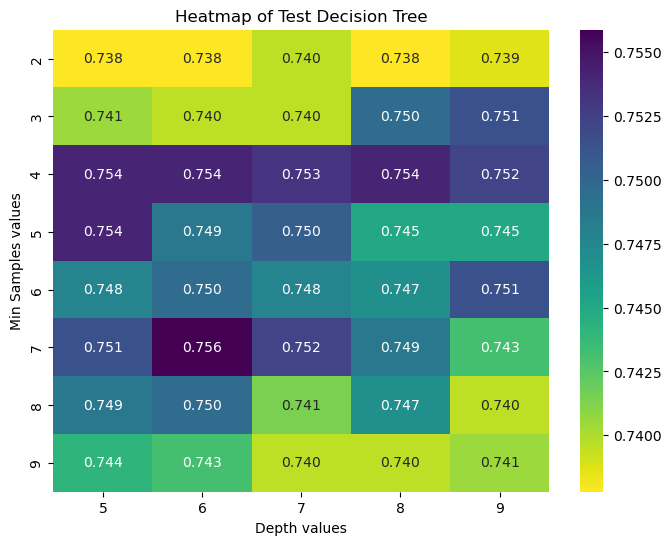

In [24]:
z = np.array(test_accuracies)
X,Y = np.meshgrid(max_depth_values,min_samples_split_values)

Z=z.reshape(len(min_samples_split_values),len(max_depth_values))

plt.figure(figsize=(8, 6))
sns.heatmap(Z, xticklabels=max_depth_values, yticklabels=min_samples_split_values, annot=True, fmt=".3f", cmap='viridis_r')
plt.xlabel('Depth values')
plt.ylabel('Min Samples values')
plt.title('Heatmap of Test Decision Tree')

In [26]:
# RandomForest
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(n_estimators=50, max_depth=1, max_features='sqrt')
rf_clf.fit(X_train, y_train)
print("Train set score: {:.2f}".format(rf_clf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(rf_clf.score(X_test, y_test)))

Train set score: 0.68
Test set score: 0.69


In [ ]:
from sklearn.metrics import accuracy_score

n_estimators_values = [50, 100, 150]
max_depth_values = [1, 2, 3]
max_features_values = ['sqrt', 'log2', None]

train_accuracies = []
test_accuracies = []

# Loop over each combination of hyperparameters and compute accuracy
for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        for max_features in max_features_values:
            
            rf_clf = RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth, max_features=max_features, random_state=42)
            rf_clf.fit(X_train, y_train)
            
            y_pred_train = rf_clf.predict(X_train)
            accuracy_train = accuracy_score(y_train, y_pred_train)
            train_accuracies.append(accuracy_train)
            
            y_pred_test = rf_clf.predict(X_test)
            accuracy_test = accuracy_score(y_test, y_pred_test)
            test_accuracies.append(accuracy_test)
            
            # Print results
            print(f"n_estimators={n_estimators}, max_depth={max_depth}, max_features={max_features}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")


n_estimators=50, max_depth=1, max_features=sqrt, Train Accuracy = 0.680, Test Accuracy = 0.696
n_estimators=50, max_depth=1, max_features=log2, Train Accuracy = 0.680, Test Accuracy = 0.696
n_estimators=50, max_depth=1, max_features=None, Train Accuracy = 0.708, Test Accuracy = 0.726
n_estimators=100, max_depth=1, max_features=sqrt, Train Accuracy = 0.680, Test Accuracy = 0.696
n_estimators=100, max_depth=1, max_features=log2, Train Accuracy = 0.680, Test Accuracy = 0.696
n_estimators=100, max_depth=1, max_features=None, Train Accuracy = 0.708, Test Accuracy = 0.726
n_estimators=150, max_depth=1, max_features=sqrt, Train Accuracy = 0.688, Test Accuracy = 0.709
n_estimators=150, max_depth=1, max_features=log2, Train Accuracy = 0.688, Test Accuracy = 0.709
n_estimators=150, max_depth=1, max_features=None, Train Accuracy = 0.708, Test Accuracy = 0.726
n_estimators=50, max_depth=2, max_features=sqrt, Train Accuracy = 0.707, Test Accuracy = 0.725
n_estimators=50, max_depth=2, max_features=l

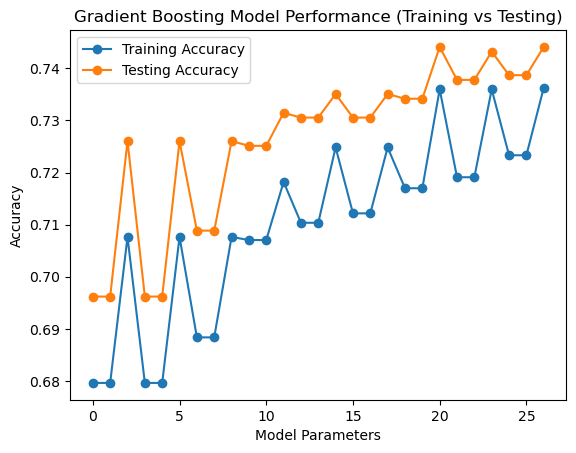

In [165]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('Gradient Boosting Model Performance (Training vs Testing)')
ax.legend()

plt.show()

In [163]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(n_estimators=50, max_depth=3, max_features=None)
rf_clf.fit(X_train, y_train)
print("Train set score: {:.2f}".format(rf_clf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(rf_clf.score(X_test, y_test)))

Train set score: 0.74
Test set score: 0.75


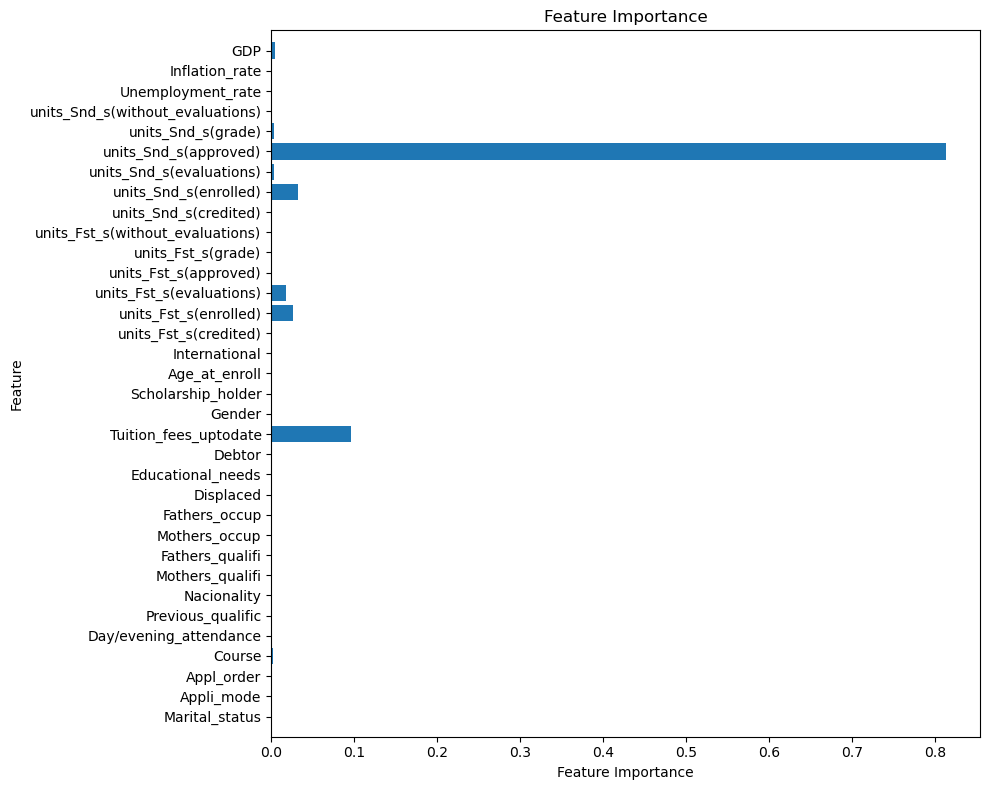

In [164]:
def plot_feature_importances(model, X_train):
    feature_names = list(X_train.columns)   # Get feature names
    n_features = len(feature_names)  # Number of features

    # Plot setup
    plt.figure(figsize=(10, 8))  
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_names)  
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)  
    plt.title("Feature Importance")
    plt.tight_layout()
    plt.show()

# Call the function with the best model
plot_feature_importances(rf_clf, X_train)


In [29]:
#Running the Gradient Boosting with no modification
from sklearn.ensemble import GradientBoostingClassifier
gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))
#We observe that we have an underfitting problem.

Accuracy on training set: 0.827
Accuracy on test set: 0.790


In [166]:
# Gradient Boosting
from sklearn.ensemble import GradientBoostingClassifier

max_depth_values = [1, 2, 3]
n_estimators_values = [50, 100, 150]
learning_rate_values = [0.01, 0.1, 0.2]
train_accuracies = []
test_accuracies = []

# Loop over each combination of hyperparameters and compute accuracy
for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        for learning_rate in learning_rate_values:
            gr_clf = GradientBoostingClassifier(max_depth=max_depth, n_estimators=n_estimators, learning_rate=learning_rate)
            gr_clf.fit(X_train, y_train)
            
            y_pred_train = gr_clf.predict(X_train)
            accuracy_train = accuracy_score(y_train, y_pred_train)
            train_accuracies.append(accuracy_train)
            y_pred_test = gr_clf.predict(X_test)
            accuracy_test = accuracy_score(y_test, y_pred_test)
            test_accuracies.append(accuracy_test)
            print(f"max_depth={max_depth}, n_estimators={n_estimators}, learning_rate={learning_rate}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")

#changing the parameters does not help to improve the model.


max_depth=1, n_estimators=50, learning_rate=0.01, Train Accuracy = 0.689, Test Accuracy = 0.697
max_depth=1, n_estimators=50, learning_rate=0.1, Train Accuracy = 0.745, Test Accuracy = 0.761
max_depth=1, n_estimators=50, learning_rate=0.2, Train Accuracy = 0.759, Test Accuracy = 0.774
max_depth=1, n_estimators=100, learning_rate=0.01, Train Accuracy = 0.708, Test Accuracy = 0.712
max_depth=1, n_estimators=100, learning_rate=0.1, Train Accuracy = 0.759, Test Accuracy = 0.773
max_depth=1, n_estimators=100, learning_rate=0.2, Train Accuracy = 0.767, Test Accuracy = 0.783
max_depth=1, n_estimators=150, learning_rate=0.01, Train Accuracy = 0.723, Test Accuracy = 0.731
max_depth=1, n_estimators=150, learning_rate=0.1, Train Accuracy = 0.763, Test Accuracy = 0.786
max_depth=1, n_estimators=150, learning_rate=0.2, Train Accuracy = 0.775, Test Accuracy = 0.784
max_depth=2, n_estimators=50, learning_rate=0.01, Train Accuracy = 0.712, Test Accuracy = 0.713
max_depth=2, n_estimators=50, learning_r

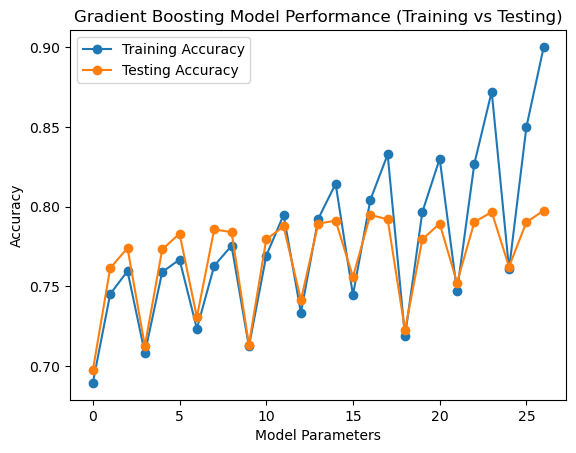

In [167]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('Gradient Boosting Model Performance (Training vs Testing)')
ax.legend()

plt.show()

In [123]:
from sklearn.ensemble import GradientBoostingClassifier
gbrt = GradientBoostingClassifier(learning_rate=0.2, max_depth=3, n_estimators=100)
gbrt.fit(X_train, y_train)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.872
Accuracy on test set: 0.797


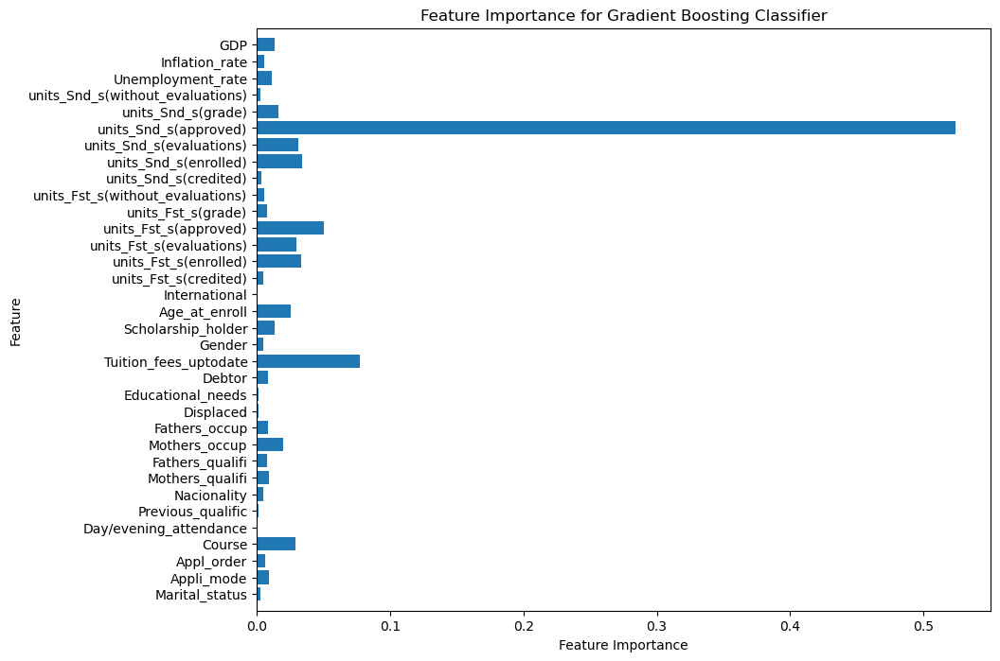

In [124]:
def plot_feature_importances(model, X_train):
    feature_names = list(X_train.columns)  
    n_features = len(feature_names) 
    
    plt.figure(figsize=(10, 8))  
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_names)  
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)  
    plt.title("Feature Importance for Gradient Boosting Classifier")
    plt.show()  

plot_feature_importances(gbrt, X_train)


## SVM

In [32]:
# SVM not tuning
from sklearn.svm import SVC
svc_clf = SVC(kernel='rbf', C=100, gamma=0.1)
svc_clf.fit(X_train, y_train)
print("Train set score: {:.2f}".format(svc_clf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test, y_test)))

Train set score: 1.00
Test set score: 0.51


In [33]:
# SVM
from sklearn.svm import SVC
svc_clf = SVC(kernel='rbf', C=100, gamma='scale')
svc_clf.fit(X_train, y_train)
print("Train set score: {:.2f}".format(svc_clf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test, y_test)))

Train set score: 0.87
Test set score: 0.77


In [34]:
# Define hyperparameter ranges
kernel_values = ['rbf', 'poly']
C_values = [0.1, 1, 10, 100, 1000]
gamma_values = [0.001, 0.01, 0.1, 1, 'scale', 'auto']

train_accuracies = []
test_accuracies = []

for kernel in kernel_values:
    for C in C_values:
        for gamma in (gamma_values if kernel == 'rbf' else [None]):
            if kernel == 'rbf':svm = SVC(kernel=kernel, C=C, gamma=gamma)
            else:svm = SVC(kernel=kernel, C=C)
            svm.fit(X_train, y_train)
            
            y_pred = svm.predict(X_train)
            accuracy_train = accuracy_score(y_train, y_pred)
            train_accuracies.append(accuracy_train)
            
            y_pred = svm.predict(X_test)
            accuracy_test = accuracy_score(y_test, y_pred)
            test_accuracies.append(accuracy_test)
            
            if kernel == 'rbf':print(f"kernel={kernel}, C={C}, gamma={gamma}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")
            else:print(f"kernel={kernel}, C={C}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")


kernel=rbf, C=0.1, gamma=0.001, Train Accuracy = 0.682, Test Accuracy = 0.690
kernel=rbf, C=0.1, gamma=0.01, Train Accuracy = 0.670, Test Accuracy = 0.667
kernel=rbf, C=0.1, gamma=0.1, Train Accuracy = 0.497, Test Accuracy = 0.506
kernel=rbf, C=0.1, gamma=1, Train Accuracy = 0.497, Test Accuracy = 0.506
kernel=rbf, C=0.1, gamma=scale, Train Accuracy = 0.672, Test Accuracy = 0.675
kernel=rbf, C=0.1, gamma=auto, Train Accuracy = 0.497, Test Accuracy = 0.506
kernel=rbf, C=1, gamma=0.001, Train Accuracy = 0.759, Test Accuracy = 0.757
kernel=rbf, C=1, gamma=0.01, Train Accuracy = 0.875, Test Accuracy = 0.736
kernel=rbf, C=1, gamma=0.1, Train Accuracy = 0.995, Test Accuracy = 0.512
kernel=rbf, C=1, gamma=1, Train Accuracy = 1.000, Test Accuracy = 0.507
kernel=rbf, C=1, gamma=scale, Train Accuracy = 0.749, Test Accuracy = 0.763
kernel=rbf, C=1, gamma=auto, Train Accuracy = 0.951, Test Accuracy = 0.687
kernel=rbf, C=10, gamma=0.001, Train Accuracy = 0.822, Test Accuracy = 0.771
kernel=rbf, C=1

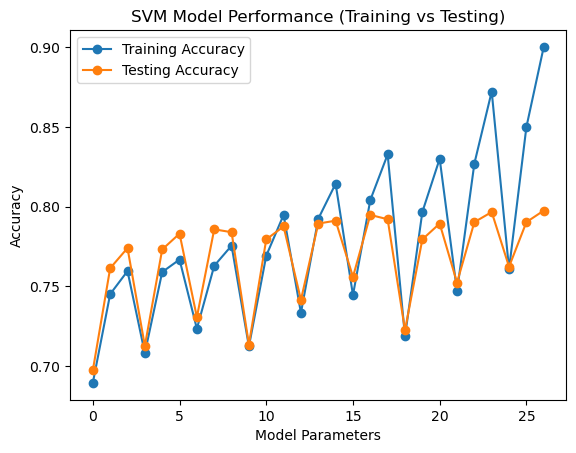

In [169]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('SVM Model Performance (Training vs Testing)')
ax.legend()

plt.show()

### Transforming the data

In [2]:
df_scl = pd.read_csv("Dataset_Project_ML.csv")

#Initial dataset
display(df_scl.head())
print("Shape of data: {}".format(df_scl.shape))
list(df_scl)

,Marital_status,Appli_mode,Appl_order,Course,Day/evening_attendance,Previous_qualific,Nacionality,Mothers_qualifi,Fathers_qualifi,Mothers_occup,...,units_Snd_s(credited),units_Snd_s(enrolled),units_Snd_s(evaluations),units_Snd_s(approved),units_Snd_s(grade),units_Snd_s(without_evaluations),Unemployment_rate,Inflation_rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,14,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13,0,13.9,-0.3,0.79,Graduate


Shape of data: (4424, 35)


['Marital_status',
 'Appli_mode',
 'Appl_order',
 'Course',
 'Day/evening_attendance',
 'Previous_qualific',
 'Nacionality',
 'Mothers_qualifi',
 'Fathers_qualifi',
 'Mothers_occup',
 'Fathers_occup',
 'Displaced',
 'Educational_needs',
 'Debtor',
 'Tuition_fees_uptodate',
 'Gender',
 'Scholarship_holder',
 'Age_at_enroll',
 'International',
 'units_Fst_s(credited)',
 'units_Fst_s(enrolled)',
 'units_Fst_s(evaluations)',
 'units_Fst_s(approved)',
 'units_Fst_s(grade)',
 'units_Fst_s(without_evaluations)',
 'units_Snd_s(credited)',
 'units_Snd_s(enrolled)',
 'units_Snd_s(evaluations)',
 'units_Snd_s(approved)',
 'units_Snd_s(grade)',
 'units_Snd_s(without_evaluations)',
 'Unemployment_rate',
 'Inflation_rate',
 'GDP',
 'Target']

# Plot Boxplots for Each Column

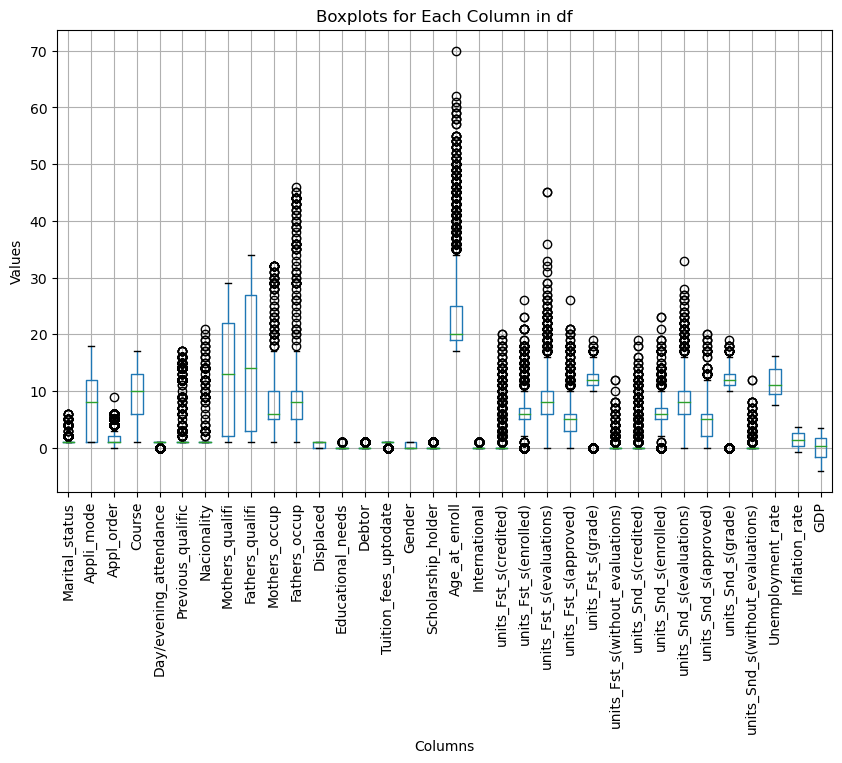

In [183]:
# Plot Boxplots for Each Column
plt.figure(figsize=(10, 6)) 
df_scl.boxplot()
plt.title('Boxplots for Each Column in df')
plt.xlabel('Columns')
plt.ylabel('Values')
plt.xticks(rotation=90)
plt.show()

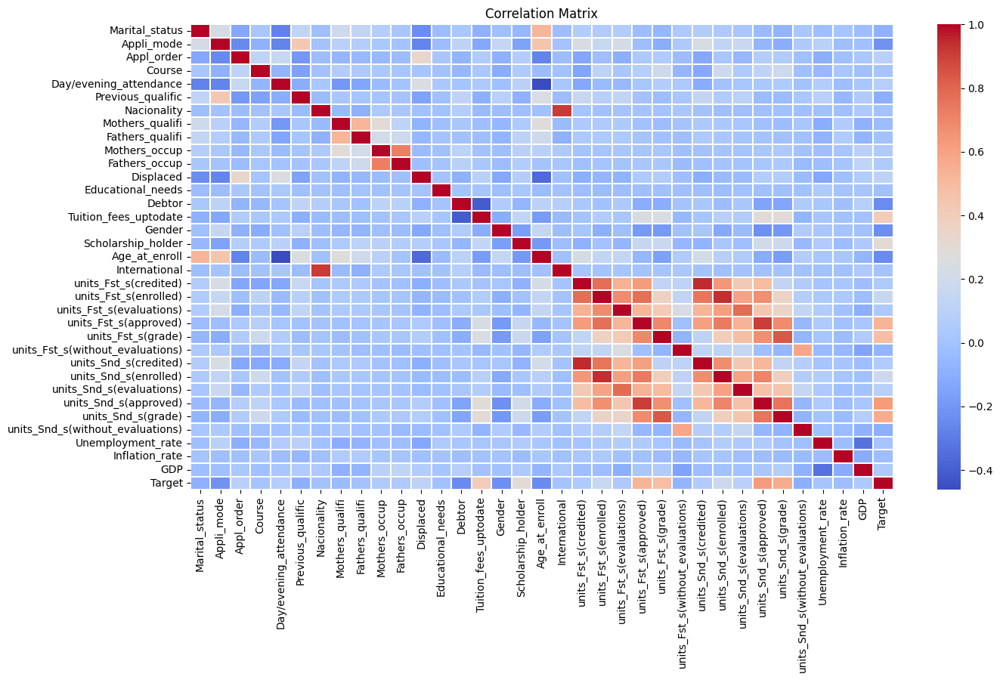

In [3]:
label_encoder = LabelEncoder()
df_scl['Target'] = label_encoder.fit_transform(df_scl['Target'])

#correlation= df.drop('Target', axis=1)
correlation_matrix = df_scl.corr()
plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".1f", linewidths=0.1)
#plt.gcf().set_facecolor('skyblue')  
plt.title('Correlation Matrix')
plt.show()

In [4]:
threshold = 0.8

# variables with correlation >0.8
high_corr = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix.abs() < 1)]

high_corr_pairs = high_corr.stack().reset_index()
high_corr_pairs.columns = ["Feature1", "Feature2", "Correlation"]
print(high_corr_pairs)


                Feature1               Feature2  Correlation
0            Nacionality          International     0.911724
1          International            Nacionality     0.911724
2  units_Fst_s(credited)  units_Snd_s(credited)     0.944811
3  units_Fst_s(enrolled)  units_Snd_s(enrolled)     0.942627
4  units_Fst_s(approved)  units_Snd_s(approved)     0.904002
5     units_Fst_s(grade)     units_Snd_s(grade)     0.834388
6  units_Snd_s(credited)  units_Fst_s(credited)     0.944811
7  units_Snd_s(enrolled)  units_Fst_s(enrolled)     0.942627
8  units_Snd_s(approved)  units_Fst_s(approved)     0.904002
9     units_Snd_s(grade)     units_Fst_s(grade)     0.834388


In [5]:
#For correlation bigger than 0.8 we decided to drop Nationality as it has redundan information of the dataset
df_scl = df_scl.drop('Nacionality', axis=1)

In [6]:
ct = ColumnTransformer(
    [("ordinal", OrdinalEncoder(), ["Appl_order"]),
     ("scaling", StandardScaler(), ["Age_at_enroll","Unemployment_rate", "Inflation_rate" , "GDP"]),
     ("onehot", OneHotEncoder(handle_unknown='ignore',sparse_output=False), ["units_Fst_s(credited)", "units_Fst_s(enrolled)", "units_Fst_s(evaluations)", "units_Fst_s(approved)", \
                                    "units_Fst_s(without_evaluations)", "units_Snd_s(credited)", "units_Snd_s(enrolled)", "units_Snd_s(evaluations)", "units_Snd_s(approved)", \
                                    "units_Snd_s(without_evaluations)","Marital_status", "Appli_mode", "Course", "Day/evening_attendance" , "Previous_qualific" , "Mothers_qualifi" , "Fathers_qualifi", \
                                     "Mothers_occup" , "Fathers_occup" , "Displaced" , "Educational_needs" , "Debtor" , "Tuition_fees_uptodate" , "Gender", "Scholarship_holder",\
                                     "International","units_Snd_s(grade)" , "units_Fst_s(grade)"])])

In [12]:
ct

ColumnTransformer(transformers=[('ordinal', OrdinalEncoder(), ['Appl_order']),
                                ('scaling', StandardScaler(),
                                 ['Age_at_enroll', 'Unemployment_rate',
                                  'Inflation_rate', 'GDP']),
                                ('onehot',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse_output=False),
                                 ['units_Fst_s(credited)',
                                  'units_Fst_s(enrolled)',
                                  'units_Fst_s(evaluations)',
                                  'units_Fst_s(approved)',
                                  'units_Fst_s(wi...
                                  'units_Snd_s(approved)',
                                  'units_Snd_s(without_evaluations)',
                                  'Marital_status', 'Appli_mode', 'Course',
                                  'Day/evening_attendance', 'Previous_qualific',
                                  'Mothers_qualifi', 'Fathers_qualifi',
                                  'Mothers_occup', 'Fathers_occup', 'Displaced',
                                  'Educational_needs', 'Debtor',
                                  'Tuition_fees_uptodate', 'Gender',
                                  'Scholarship_holder', 'International',
                                  'units_Snd_s(grade)',
                                  'units_Fst_s(grade)'])])

In [7]:
label_encoder = LabelEncoder()
df_scl['Target'] = label_encoder.fit_transform(df_scl['Target'])
X= df_scl.iloc[:, 0:33]
y = df_scl.iloc[:, -1]


In [8]:
# Separating the data into training and testing

X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, random_state=0)

# Fit the transformer on the training data
ct.fit(X_train2)

# Transform both training and testing data
X_train_scaled = ct.transform(X_train2)
X_test_scaled = ct.transform(X_test2)

print(X_train2.shape)
print(X_test2.shape)
print(X_train_scaled.shape)
print(X_test_scaled.shape)
#the size of your test set did not change your preprocessing.

(3318, 33)
(1106, 33)
(3318, 436)
(1106, 436)


In [ ]:
# Set the parameters # of neighbors
knn=KNeighborsClassifier()#n_neighbors=10)

knn.fit(X_train_scaled, y_train2)
y_pred=knn.predict(X_test_scaled)
accuracy =np.mean(y_pred==y_test2)
print('Test accuracy {:.4f}'.format(accuracy),'(neighbors=10)')

Test accuracy 0.7360 (neighbors=10)


In [191]:
n_neighbors_values = list(range(1, 21))
train_accuracies = []
test_accuracies = []

for n_neighbors in n_neighbors_values:
    Knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    Knn.fit(X_train_scaled, y_train2)
    
    y_pred_train = Knn.predict(X_train_scaled)
    accuracy_train = accuracy_score(y_train2, y_pred_train)
    train_accuracies.append(accuracy_train)
    
    y_pred_test = Knn.predict(X_test_scaled)
    accuracy_test = accuracy_score(y_test2, y_pred_test)
    test_accuracies.append(accuracy_test)
    
    print(f"n_neighbors={n_neighbors}, Accuracy train = {accuracy_train:.3f}, Accuracy test = {accuracy_test:.3f}")

n_neighbors=1, Accuracy train = 1.000, Accuracy test = 0.685
n_neighbors=2, Accuracy train = 0.877, Accuracy test = 0.667
n_neighbors=3, Accuracy train = 0.827, Accuracy test = 0.728
n_neighbors=4, Accuracy train = 0.810, Accuracy test = 0.723
n_neighbors=5, Accuracy train = 0.792, Accuracy test = 0.735
n_neighbors=6, Accuracy train = 0.780, Accuracy test = 0.724
n_neighbors=7, Accuracy train = 0.771, Accuracy test = 0.736
n_neighbors=8, Accuracy train = 0.773, Accuracy test = 0.742
n_neighbors=9, Accuracy train = 0.769, Accuracy test = 0.739
n_neighbors=10, Accuracy train = 0.763, Accuracy test = 0.738
n_neighbors=11, Accuracy train = 0.757, Accuracy test = 0.725
n_neighbors=12, Accuracy train = 0.750, Accuracy test = 0.729
n_neighbors=13, Accuracy train = 0.741, Accuracy test = 0.725
n_neighbors=14, Accuracy train = 0.739, Accuracy test = 0.727
n_neighbors=15, Accuracy train = 0.738, Accuracy test = 0.722
n_neighbors=16, Accuracy train = 0.737, Accuracy test = 0.723
n_neighbors=17, A

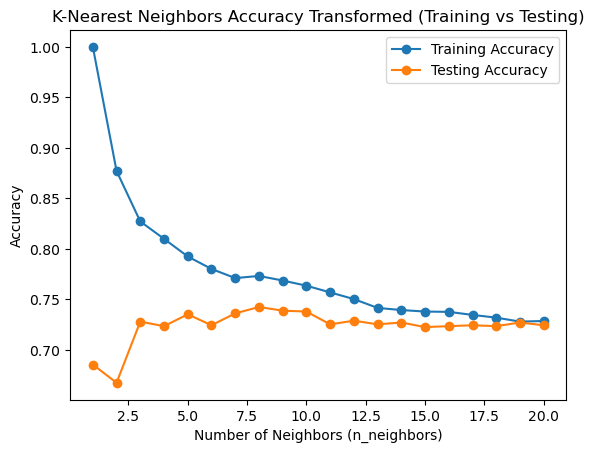

In [192]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(n_neighbors_values, train_accuracies, label="Training Accuracy", marker='o')
ax.plot(n_neighbors_values, test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Number of Neighbors (n_neighbors)')
ax.set_ylabel('Accuracy')
ax.set_title('K-Nearest Neighbors Accuracy Transformed (Training vs Testing)')
ax.legend()

plt.show()

## Cross-validation Knn

In [193]:
# Cross-validation
scores_knn = cross_val_score(knn, X, y)
print("Cross-validation scores: {}".format(scores_knn))
print("Average cross-validation score: {:.2f}".format(scores_knn.mean()))

Cross-validation scores: [0.68248588 0.66779661 0.68587571 0.69830508 0.66742081]
Average cross-validation score: 0.68


In [194]:
from sklearn.model_selection import cross_validate
res_knn = cross_validate(Knn, X, y, cv=5,
                     return_train_score=True)
display(res_knn)

{'fit_time': array([0.01154208, 0.01301908, 0.00611782, 0.00961852, 0.00774717]),
 'score_time': array([0.23231721, 0.28563809, 0.22460437, 0.24153447, 0.18893957]),
 'test_score': array([0.68700565, 0.68813559, 0.70056497, 0.69830508, 0.6821267 ]),
 'train_score': array([0.71658661, 0.71319582, 0.71037016, 0.7083922 , 0.71723164])}

In [195]:
res_knn_df = pd.DataFrame(res_knn)
display(res_knn_df)
print("Mean times and scores:\n", res_knn_df.mean())

,fit_time,score_time,test_score,train_score
0,0.011542,0.232317,0.687006,0.716587
1,0.013019,0.285638,0.688136,0.713196
2,0.006118,0.224604,0.700565,0.710370
3,0.009619,0.241534,0.698305,0.708392
4,0.007747,0.188940,0.682127,0.717232


Mean times and scores:
 fit_time       0.009609
score_time     0.234607
test_score     0.691228
train_score    0.713155
dtype: float64


In [196]:
#Stratified K-Fold cross-validation
from sklearn.model_selection import StratifiedKFold
skf_knn = StratifiedKFold(n_splits=5)
res_knnskf = cross_validate(knn, X, y, cv=skf_knn,return_train_score=True)
res_knnskf = pd.DataFrame(res_knnskf)
display(res_knnskf)

,fit_time,score_time,test_score,train_score
0,0.003117,0.124903,0.682486,0.783272
1,0.006538,0.157563,0.667797,0.781577
2,0.008001,0.153895,0.685876,0.774795
3,0.006400,0.190048,0.698305,0.780729
4,0.006494,0.156800,0.667421,0.785593


In [197]:
# More control over cross-validation
from sklearn.model_selection import KFold
kfold = KFold(n_splits=5)
print("Cross-validation scores:\n{}".format(
    cross_val_score(knn, X, y, cv=kfold)))

Cross-validation scores:
[0.68135593 0.67570621 0.69152542 0.69265537 0.66176471]


In [198]:
# Leave-one-out cross-validation
from sklearn.model_selection import LeaveOneOut
loo = LeaveOneOut()
scores = cross_val_score(knn, X, y, cv=loo)
print("Number of cv iterations: ", len(scores))
print("Mean accuracy: {:.2f}".format(scores.mean()))

Number of cv iterations:  4424
Mean accuracy: 0.68


In [199]:
# Shuffle-split cross-validation
from sklearn.model_selection import ShuffleSplit
shuffle_split = ShuffleSplit(test_size=.5, train_size=.5, n_splits=10)
scores = cross_val_score(knn, X, y, cv=shuffle_split)
print("Cross-validation scores:\n{}".format(scores))

Cross-validation scores:
[0.67450271 0.67721519 0.66094033 0.65370705 0.67088608 0.66455696
 0.65777577 0.66907776 0.66139241 0.66229656]


### SearchGrid

In [10]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Create the KNN model
knn = KNeighborsClassifier()

# Define the parameter grid
param_grid_knn = {
    'n_neighbors': range(1, 21)
}

# Create the GridSearch
grid_search_knn = GridSearchCV(knn, param_grid_knn, cv=5, return_train_score=True)

# Fit the grid search to the training data
grid_search_knn.fit(X_train_scaled, y_train2)

# Print the best parameters and best score
print("Best parameters found: ", grid_search_knn.best_params_)
print("Best cross-validation score: {:.3f}".format(grid_search_knn.best_score_))

# Evaluate the best model on the test set
best_model_knn = grid_search_knn.best_estimator_
train_score_knn = best_model_knn.score(X_train_scaled, y_train2)
test_score_knn = best_model_knn.score(X_test_scaled, y_test2)

Best parameters found:  {'n_neighbors': 12}
Best cross-validation score: 0.699


In [201]:
best_model_knn

KNeighborsClassifier(n_neighbors=12)

In [202]:
print(best_model_knn)
print('Best Train accuracy knn {:.4f}'.format(train_score_knn))
print('Best Test accuracy knn {:.4f}'.format(test_score_knn))


KNeighborsClassifier(n_neighbors=12)
Best Train accuracy knn 0.7502
Best Test accuracy knn 0.7288


### Evaluation Metrics and Scoring KNN

In [11]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, classification_report

# Evaluate the best model on the test set
y_pred_knn = best_model_knn.predict(X_test_scaled)

# Calculate evaluation metrics
accuracy_knn = accuracy_score(y_test2, y_pred_knn)
precision_knn = precision_score(y_test2, y_pred_knn, average='weighted')
recall_knn = recall_score(y_test2, y_pred_knn, average='weighted')
f1_knn = f1_score(y_test2, y_pred_knn, average='weighted')
conf_matrix_knn = confusion_matrix(y_test2, y_pred_knn)
roc_auc_knn = roc_auc_score(y_test2, best_model_knn.predict_proba(X_test_scaled), multi_class='ovr')

# Print evaluation metrics
print("Test set accuracy: {:.3f}".format(accuracy_knn))
print("Test set precision: {:.3f}".format(precision_knn))
print("Test set recall: {:.3f}".format(recall_knn))
print("Test set F1 score: {:.3f}".format(f1_knn))
print("Confusion matrix:\n", conf_matrix_knn)
print("ROC AUC score: {:.3f}".format(roc_auc_knn))
print("Classification report:\n", classification_report(y_test2, y_pred_knn))


Test set accuracy: 0.731
Test set precision: 0.705
Test set recall: 0.731
Test set F1 score: 0.703
Confusion matrix:
 [[244  30  79]
 [ 51  39 103]
 [ 18  16 526]]
ROC AUC score: 0.859
Classification report:
               precision    recall  f1-score   support

           0       0.78      0.69      0.73       353
           1       0.46      0.20      0.28       193
           2       0.74      0.94      0.83       560

    accuracy                           0.73      1106
   macro avg       0.66      0.61      0.61      1106
weighted avg       0.71      0.73      0.70      1106



In [13]:
# Naive Bayes Classifier

NB = GaussianNB()
brn = BernoulliNB()

NB.fit(X_train_scaled, y_train2).predict(X_test_scaled)

print("GBN Train set score: {:.2f}".format(NB.score(X_train_scaled, y_train2)))
print("GBN Test set score: {:.2f}".format(NB.score(X_test_scaled, y_test2)))

brn.fit(X_train_scaled, y_train2).predict(X_test_scaled)
print("BRN Train set score: {:.2f}".format(brn.score(X_train_scaled, y_train2)))
print("BRN Test set score: {:.2f}".format(brn.score(X_test_scaled, y_test2)))

GBN Train set score: 0.27
GBN Test set score: 0.23
BRN Train set score: 0.72
BRN Test set score: 0.71


In [15]:
best_model_NB = brn.fit(X_train_scaled, y_train2)

# Evaluate the best model on the test set
y_pred_NB = best_model_NB.predict(X_test_scaled)

# Calculate evaluation metrics
accuracy_NB = accuracy_score(y_test2, y_pred_NB)
precision_NB = precision_score(y_test2, y_pred_NB, average='weighted')
recall_NB = recall_score(y_test2, y_pred_NB, average='weighted')
f1_NB = f1_score(y_test2, y_pred_NB, average='weighted')
conf_matrix_NB = confusion_matrix(y_test2, y_pred_NB)
roc_auc_NB = roc_auc_score(y_test2, best_model_NB.predict_proba(X_test_scaled), multi_class='ovr')

# Print evaluation metrics
print("Test set accuracy: {:.3f}".format(accuracy_NB))
print("Test set precision: {:.3f}".format(precision_NB))
print("Test set recall: {:.3f}".format(recall_NB))
print("Test set F1 score: {:.3f}".format(f1_NB))
print("Confusion matrix:\n", conf_matrix_NB)
print("ROC AUC score: {:.3f}".format(roc_auc_NB))
print("Classification report:\n", classification_report(y_test2, y_pred_NB))


Test set accuracy: 0.713
Test set precision: 0.733
Test set recall: 0.713
Test set F1 score: 0.721
Confusion matrix:
 [[250  72  31]
 [ 32  97  64]
 [ 40  78 442]]
ROC AUC score: 0.861
Classification report:
               precision    recall  f1-score   support

           0       0.78      0.71      0.74       353
           1       0.39      0.50      0.44       193
           2       0.82      0.79      0.81       560

    accuracy                           0.71      1106
   macro avg       0.66      0.67      0.66      1106
weighted avg       0.73      0.71      0.72      1106



In [ ]:
# Decision Tree

max_depth_values = list(range(5, 10))
min_samples_split_values = list(range(2, 10))
train_accuracies = []
test_accuracies = []

for max_depth in max_depth_values:
    for min_samples_split in min_samples_split_values:
            tree = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split)
            tree.fit(X_train_scaled, y_train2)
            
            y_pred_train = tree.predict(X_train_scaled)
            accuracy_train2 = accuracy_score(y_train2, y_pred_train)
            train_accuracies.append(accuracy_train2)
    
            y_pred_test = tree.predict(X_test_scaled)
            accuracy_test = accuracy_score(y_test2, y_pred_test)
            test_accuracies.append(accuracy_test)
    
            print(f"max_depth={max_depth}, min_samples_split={min_samples_split}, Train Accuracy = {accuracy_train2:.3f}, Test Accuracy = {accuracy_test:.3f}")

max_depth=5, min_samples_split=2, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=3, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=4, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=5, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=6, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=7, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=8, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=5, min_samples_split=9, Train Accuracy = 0.756, Test Accuracy = 0.751
max_depth=6, min_samples_split=2, Train Accuracy = 0.767, Test Accuracy = 0.754
max_depth=6, min_samples_split=3, Train Accuracy = 0.767, Test Accuracy = 0.755
max_depth=6, min_samples_split=4, Train Accuracy = 0.767, Test Accuracy = 0.756
max_depth=6, min_samples_split=5, Train Accuracy = 0.767, Test Accuracy = 0.754
max_depth=6, min_samples_split=6, Train 

Text(0.5, 1.0, 'Heatmap of Train Decision Tree Training/ Transformed')

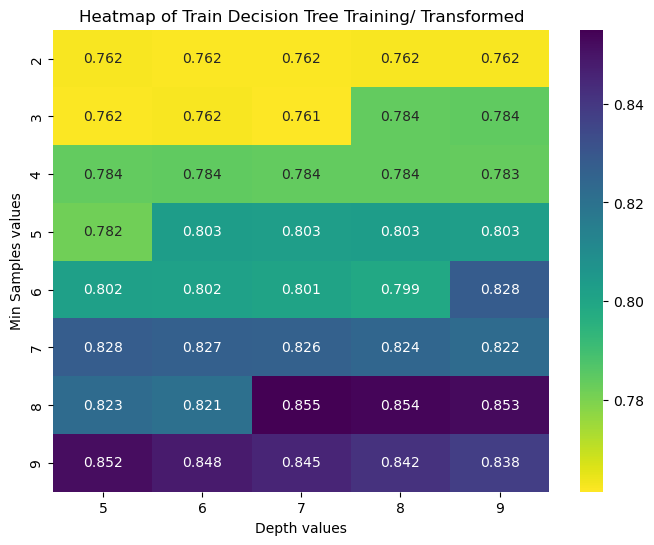

In [176]:
z = np.array(train_accuracies)
X,Y = np.meshgrid(max_depth_values,min_samples_split_values)

Z=z.reshape(len(min_samples_split_values),len(max_depth_values))

plt.figure(figsize=(8, 6))
sns.heatmap(Z, xticklabels=max_depth_values, yticklabels=min_samples_split_values, annot=True, fmt=".3f", cmap='viridis_r')
plt.xlabel('Depth values')
plt.ylabel('Min Samples values')
plt.title('Heatmap of Train Decision Tree Training/ Transformed')

Text(0.5, 1.0, 'Heatmap of Test Decision Tree / Transformed')

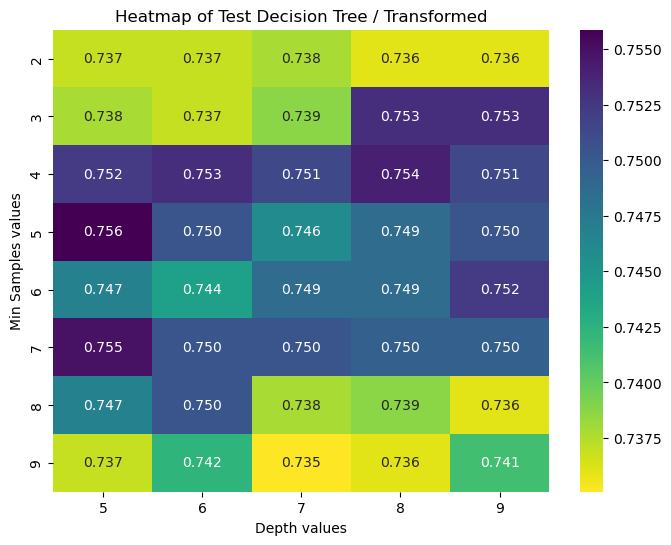

In [177]:
z = np.array(test_accuracies)
X,Y = np.meshgrid(max_depth_values,min_samples_split_values)

Z=z.reshape(len(min_samples_split_values),len(max_depth_values))

plt.figure(figsize=(8, 6))
sns.heatmap(Z, xticklabels=max_depth_values, yticklabels=min_samples_split_values, annot=True, fmt=".3f", cmap='viridis_r')
plt.xlabel('Depth values')
plt.ylabel('Min Samples values')
plt.title('Heatmap of Test Decision Tree / Transformed')

## SearchGrid

In [ ]:
# Create the tree model
tree = DecisionTreeClassifier()

# Define the parameter grid
param_grid_tree = {
    'max_depth': range(5, 10),
    'min_samples_split': range(2, 10)
}

grid_search_tree = GridSearchCV(tree, param_grid_tree, cv=5, return_train_score=True)

grid_search_tree.fit(X_train_scaled, y_train2)

print("Best parameters found: ", grid_search_tree.best_params_)
print("Best cross-validation score: {:.3f}".format(grid_search_tree.best_score_))

# Evaluate the best model on the test set
best_model_tree = grid_search_tree.best_estimator_
train_score_tree = best_model_tree.score(X_train_scaled, y_train2)
test_score_tree = best_model_tree.score(X_test_scaled, y_test2)

Best parameters found:  {'max_depth': 8, 'min_samples_split': 3}
Best cross-validation score: 0.742


In [207]:
print(best_model_tree)
print('Best Train accuracy {:.4f}'.format(train_score_tree))
print('Best Test accuracy {:.4f}'.format(test_score_tree))

DecisionTreeClassifier(max_depth=8, min_samples_split=4)
Best Train accuracy 0.8005
Best Test accuracy 0.7541


## Evaluation Metrics and Scoring DT

In [21]:
y_pred_tree = best_model_tree.predict(X_test_scaled)

# Calculate evaluation metrics
accuracy_tree = accuracy_score(y_test2, y_pred_tree)
precision_tree = precision_score(y_test2, y_pred_tree, average='weighted')
recall_tree = recall_score(y_test2, y_pred_tree, average='weighted')
f1_tree = f1_score(y_test2, y_pred_tree, average='weighted')
conf_matrix_tree = confusion_matrix(y_test2, y_pred_tree)
roc_auc_tree = roc_auc_score(y_test2, best_model_tree.predict_proba(X_test_scaled), multi_class='ovr')

# Print evaluation metrics
print("Test set accuracy: {:.3f}".format(accuracy_tree))
print("Test set precision: {:.3f}".format(precision_tree))
print("Test set recall: {:.3f}".format(recall_tree))
print("Test set F1 score: {:.3f}".format(f1_tree))
print("Confusion matrix:\n", conf_matrix_tree)
print("ROC AUC score: {:.3f}".format(roc_auc_tree))
print("Classification report:\n", classification_report(y_test2, y_pred_tree))

Test set accuracy: 0.755
Test set precision: 0.742
Test set recall: 0.755
Test set F1 score: 0.739
Confusion matrix:
 [[240  46  67]
 [ 40  65  88]
 [ 13  17 530]]
ROC AUC score: 0.820
Classification report:
               precision    recall  f1-score   support

           0       0.82      0.68      0.74       353
           1       0.51      0.34      0.40       193
           2       0.77      0.95      0.85       560

    accuracy                           0.75      1106
   macro avg       0.70      0.65      0.67      1106
weighted avg       0.74      0.75      0.74      1106



In [22]:
# RandomForest
rf_clf = RandomForestClassifier()# Default values give higher accuracy in test n_estimators=50, max_depth=1, max_features='sqrt'
rf_clf.fit(X_train_scaled, y_train2)
print("Train set score: {:.2f}".format(rf_clf.score(X_train_scaled, y_train2)))
print("Test set score: {:.2f}".format(rf_clf.score(X_test_scaled, y_test2)))

Train set score: 1.00
Test set score: 0.78


In [210]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

n_estimators_values = [50, 100, 150]
max_depth_values = [1, 2, 3]
max_features_values = ['sqrt', 'log2', None]

train_accuracies = []
test_accuracies = []

for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        for max_features in max_features_values:
            # Initialize and fit the Random Forest Classifier
            rf_clf = RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth,max_features=max_features,random_state=42)
            rf_clf.fit(X_train_scaled, y_train2)  
            
            y_pred_train = rf_clf.predict(X_train_scaled)
            accuracy_train = accuracy_score(y_train2, y_pred_train)
            train_accuracies.append(accuracy_train)
            
            y_pred_test = rf_clf.predict(X_test_scaled)
            accuracy_test = accuracy_score(y_test2, y_pred_test)
            test_accuracies.append(accuracy_test)
            
            print(f"n_estimators={n_estimators}, max_depth={max_depth}, max_features={max_features}, Train Accuracy = {accuracy_train:.3f}, Test Accuracy = {accuracy_test:.3f}")

n_estimators=50, max_depth=1, max_features=sqrt, Train Accuracy = 0.556, Test Accuracy = 0.563
n_estimators=50, max_depth=1, max_features=log2, Train Accuracy = 0.498, Test Accuracy = 0.507
n_estimators=50, max_depth=1, max_features=None, Train Accuracy = 0.643, Test Accuracy = 0.656
n_estimators=100, max_depth=1, max_features=sqrt, Train Accuracy = 0.564, Test Accuracy = 0.570
n_estimators=100, max_depth=1, max_features=log2, Train Accuracy = 0.497, Test Accuracy = 0.506
n_estimators=100, max_depth=1, max_features=None, Train Accuracy = 0.643, Test Accuracy = 0.656
n_estimators=150, max_depth=1, max_features=sqrt, Train Accuracy = 0.561, Test Accuracy = 0.567
n_estimators=150, max_depth=1, max_features=log2, Train Accuracy = 0.497, Test Accuracy = 0.506
n_estimators=150, max_depth=1, max_features=None, Train Accuracy = 0.643, Test Accuracy = 0.656
n_estimators=50, max_depth=2, max_features=sqrt, Train Accuracy = 0.670, Test Accuracy = 0.673
n_estimators=50, max_depth=2, max_features=l

In [ ]:
# Feature importance Random forest

## SearchGrid Random Forest

In [ ]:
# Create the rf_clf model
rf_clf = RandomForestClassifier()

# Define the parameter grid
param_grid_rf_clf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [1, 2, 3],
    'max_features': ['sqrt', 'log2', None]
}


grid_search_rf_clf = GridSearchCV(rf_clf, param_grid_rf_clf, cv=5, return_train_score=True)

a
grid_search_rf_clf.fit(X_train2, y_train2)

print("Best parameters found: ", grid_search_rf_clf.best_params_)
print("Best cross-validation score: {:.3f}".format(grid_search_rf_clf.best_score_))

best_model_rf_clf = grid_search_rf_clf.best_estimator_
train_score_rf_clf = best_model_rf_clf.score(X_train2, y_train2)
test_score_rf_clf = best_model_rf_clf.score(X_test2, y_test2)

print("Train set score with best model: {:.3f}".format(train_score_rf_clf))
print("Test set score with best model: {:.3f}".format(test_score_rf_clf))


Best parameters found:  {'max_depth': 3, 'max_features': None, 'n_estimators': 100}
Best cross-validation score: 0.730
Train set score with best model: 0.734
Test set score with best model: 0.740


In [211]:
print(best_model_rf_clf)
print('Best Train accuracy Random Forest {:.4f}'.format(train_score_rf_clf))
print('Best Test accuracy Random Forest {:.4f}'.format(test_score_rf_clf))

RandomForestClassifier(max_depth=3, max_features=None, n_estimators=50)
Best Train accuracy Random Forest 0.7363
Best Test accuracy Random Forest 0.7441


### Evaluation Metrics and Scoring Random Forest

In [ ]:
# Evaluate the best model on the test set
y_pred_rf_clf = best_model_rf_clf.predict(X_test2)

accuracy_rf_clf = accuracy_score(y_test2, y_pred_rf_clf)
precision_rf_clf = precision_score(y_test2, y_pred_rf_clf, average='weighted')
recall_rf_clf = recall_score(y_test2, y_pred_rf_clf, average='weighted')
f1_rf_clf = f1_score(y_test2, y_pred_rf_clf, average='weighted')
conf_matrix_rf_clf = confusion_matrix(y_test2, y_pred_rf_clf)
roc_auc_rf_clf = roc_auc_score(y_test2, best_model_rf_clf.predict_proba(X_test2), multi_class='ovr')

print("Test set accuracy: {:.3f}".format(accuracy_rf_clf))
print("Test set precision: {:.3f}".format(precision_rf_clf))
print("Test set recall: {:.3f}".format(recall_rf_clf))
print("Test set F1 score: {:.3f}".format(f1_rf_clf))
print("Confusion matrix:\n", conf_matrix_rf_clf)
print("ROC AUC score: {:.3f}".format(roc_auc_rf_clf))
print("Classification report:\n", classification_report(y_test2, y_pred_rf_clf))

Test set accuracy: 0.740
Test set precision: 0.711
Test set recall: 0.740
Test set F1 score: 0.705
Confusion matrix:
 [[254  27  72]
 [ 50  32 111]
 [ 21   7 532]]
ROC AUC score: 0.859
Classification report:
               precision    recall  f1-score   support

           0       0.78      0.72      0.75       353
           1       0.48      0.17      0.25       193
           2       0.74      0.95      0.83       560

    accuracy                           0.74      1106
   macro avg       0.67      0.61      0.61      1106
weighted avg       0.71      0.74      0.70      1106



In [213]:
# RandomForest
rf_clf = RandomForestClassifier(max_depth=3, max_features=None, n_estimators=100)
rf_clf.fit(X_train2, y_train2)
print("Train set score: {:.2f}".format(rf_clf.score(X_train2, y_train2)))
print("Test set score: {:.2f}".format(rf_clf.score(X_test2, y_test2)))

Train set score: 0.74
Test set score: 0.74


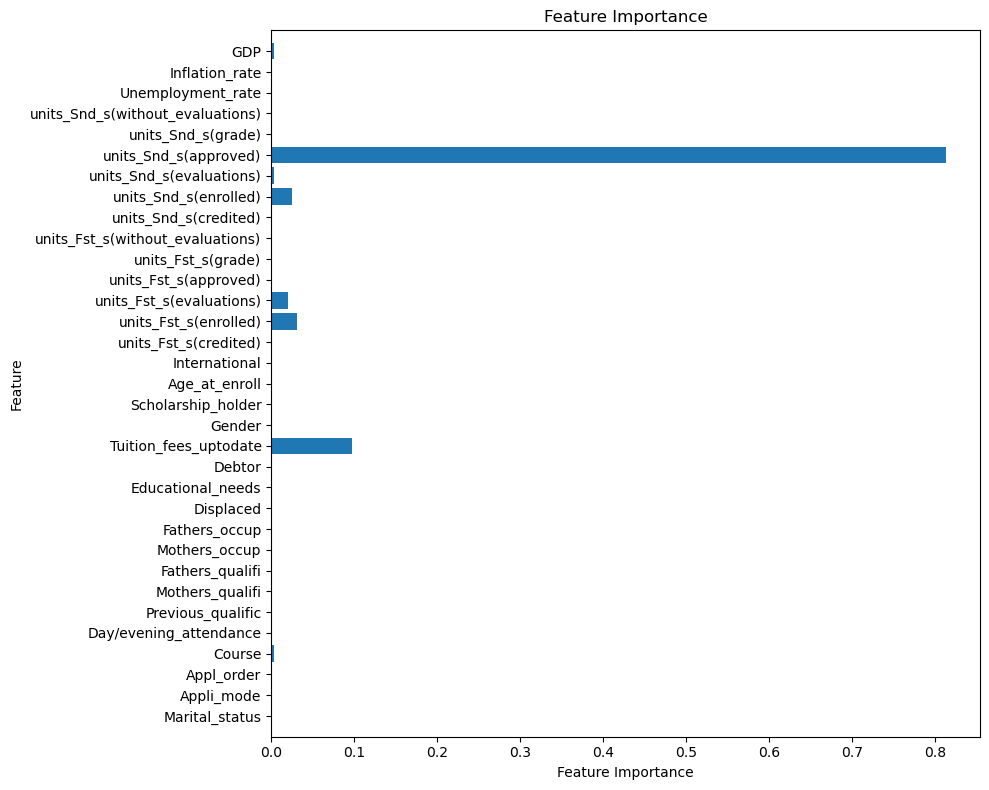

In [214]:
def plot_feature_importances(model, X_train):
    feature_names = list(X_train2.columns)   # Get feature names
    n_features = len(feature_names)  # Number of features

    # Plot setup
    plt.figure(figsize=(10, 8))  
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_names)  
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)  
    plt.title("Feature Importance")
    plt.tight_layout()
    plt.show()

# Call the function with the best model
plot_feature_importances(rf_clf, X_train2)


## GradientBoosting

In [215]:
#Running the Gradient Boosting with transformations

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train2, y_train2)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train2, y_train2)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test2, y_test2)))

Accuracy on training set: 0.830
Accuracy on test set: 0.795


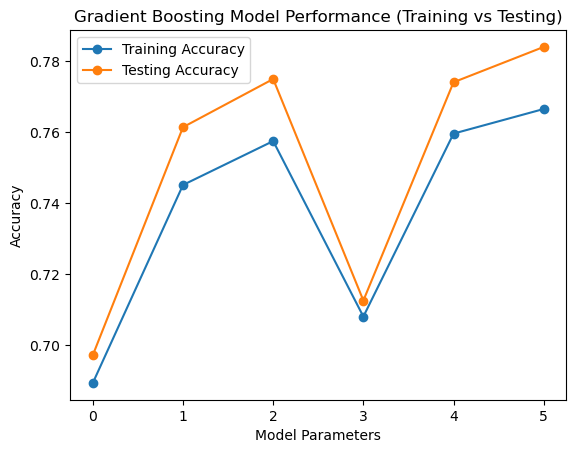

In [90]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('Gradient Boosting Model Performance (Training vs Testing)')
ax.legend()

plt.show()

In [216]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

gbrt = GradientBoostingClassifier()

# Define the parameter grid
param_grid_gbrt = {
    'max_depth': [1, 2, 3],
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2]
}

grid_search_gbrt = GridSearchCV(gbrt, param_grid_gbrt, cv=5, return_train_score=True)

grid_search_gbrt.fit(X_train2, y_train2)

print("Best parameters found: ", grid_search_gbrt.best_params_)
print("Best cross-validation score: {:.3f}".format(grid_search_gbrt.best_score_))

best_model_gbrt = grid_search_gbrt.best_estimator_
train_score_gbrt = best_model_gbrt.score(X_train2, y_train2)
test_score_gbrt = best_model_gbrt.score(X_test2, y_test2)

print("Train set score with best model: {:.3f}".format(train_score_gbrt))
print("Test set score with best model: {:.3f}".format(test_score_gbrt))


Best parameters found:  {'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 150}
Best cross-validation score: 0.770
Train set score with best model: 0.833
Test set score with best model: 0.794


In [ ]:
# Gradientbosting using transformdata
gbrt = GradientBoostingClassifier(max_depth=2, n_estimators=150,learning_rate=0.2)
gbrt.fit(X_train_scaled, y_train2)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train_scaled, y_train2)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test_scaled, y_test2)))

Accuracy on training set: 0.836
Accuracy on test set: 0.778


In [218]:
# Gradientbosting using data before transformation
gbrt = GradientBoostingClassifier(max_depth=2, n_estimators=150,learning_rate=0.2)
gbrt.fit(X_train2, y_train2)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train2, y_train2)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test2, y_test2)))

Accuracy on training set: 0.833
Accuracy on test set: 0.794


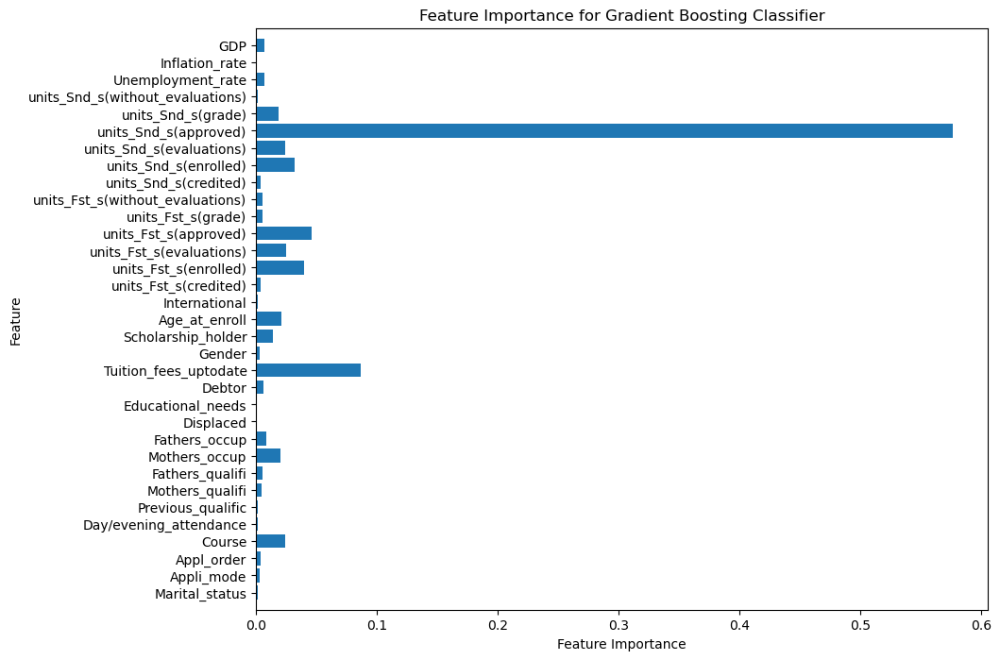

In [219]:
def plot_feature_importances(model, X_train2):
    feature_names = list(X_train2.columns)  
    n_features = len(feature_names) 
    
    plt.figure(figsize=(10, 8))  
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_names)  
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)  
    plt.title("Feature Importance for Gradient Boosting Classifier")
    plt.show()  

plot_feature_importances(gbrt, X_train2)


In [ ]:
# Evaluate the best model on the test set
y_pred_gbrt = best_model_gbrt.predict(X_test2)

# Calculate evaluation metrics
accuracy_gbrt = accuracy_score(y_test2, y_pred_gbrt)
precision_gbrt = precision_score(y_test2, y_pred_gbrt, average='weighted')
recall_gbrt = recall_score(y_test2, y_pred_gbrt, average='weighted')
f1_gbrt = f1_score(y_test2, y_pred_gbrt, average='weighted')
conf_matrix_gbrt = confusion_matrix(y_test2, y_pred_gbrt)
roc_auc_gbrt = roc_auc_score(y_test2, best_model_gbrt.predict_proba(X_test2), multi_class='ovr')


print("Test set accuracy: {:.3f}".format(accuracy_gbrt))
print("Test set precision: {:.3f}".format(precision_gbrt))
print("Test set recall: {:.3f}".format(recall_gbrt))
print("Test set F1 score: {:.3f}".format(f1_gbrt))
print("Confusion matrix:\n", conf_matrix_gbrt)
print("ROC AUC score: {:.3f}".format(roc_auc_gbrt))
print("Classification report:\n", classification_report(y_test2, y_pred_gbrt))


Test set accuracy: 0.794
Test set precision: 0.783
Test set recall: 0.794
Test set F1 score: 0.786
Confusion matrix:
 [[274  41  38]
 [ 47  86  60]
 [ 22  20 518]]
ROC AUC score: 0.904
Classification report:
               precision    recall  f1-score   support

           0       0.80      0.78      0.79       353
           1       0.59      0.45      0.51       193
           2       0.84      0.93      0.88       560

    accuracy                           0.79      1106
   macro avg       0.74      0.72      0.72      1106
weighted avg       0.78      0.79      0.79      1106



## SVM

In [155]:
# SVM scalling does not apply

svc_clf = SVC(kernel='rbf', C=100, gamma=0.1)
svc_clf.fit(X_train_scaled, y_train2)
print("Train set score: {:.2f}".format(svc_clf.score(X_train_scaled, y_train2)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test_scaled, y_test2)))

Train set score: 1.00
Test set score: 0.78


In [154]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

svc=SVC()

# Define the parameter grid
param_grid_svc_clf = {
    'kernel': ['rbf'],
    'C': [0.1, 1, 10, 100],
    'gamma' : [0.001, 0.01, 'scale']
}

grid_search_svc_clf = GridSearchCV(svc, param_grid_svc_clf, cv=5, return_train_score=True)

grid_search_svc_clf.fit(X_train_scaled, y_train2)

print("Best parameters found: ", grid_search_svc_clf.best_params_)
print("Best cross-validation score: {:.3f}".format(grid_search_svc_clf.best_score_))

best_model_svc_clf = grid_search_svc_clf.best_estimator_
train_score_svc_clf = best_model_svc_clf.score(X_train_scaled, y_train2)
test_score_svc_clf = best_model_svc_clf.score(X_test_scaled, y_test2)


Best parameters found:  {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Best cross-validation score: 0.763


In [156]:
svc_clf = SVC(kernel='rbf', C=10, gamma=0.01)
svc_clf.fit(X_train_scaled, y_train2)
print("Train set score: {:.2f}".format(svc_clf.score(X_train_scaled, y_train2)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test_scaled, y_test2)))

Train set score: 0.89
Test set score: 0.81


In [157]:
svc_clf = SVC(kernel='rbf', C=10, gamma=0.01, probability=True)
svc_clf.fit(X_train_scaled, y_train2)
y_pred_svc = svc_clf.predict(X_test_scaled)
y_pred_proba_svc = svc_clf.predict_proba(X_test_scaled)

accuracy_svc = accuracy_score(y_test2, y_pred_svc)
precision_svc = precision_score(y_test2, y_pred_svc, average='weighted')
recall_svc = recall_score(y_test2, y_pred_svc, average='weighted')
f1_svc = f1_score(y_test2, y_pred_svc, average='weighted')
conf_matrix_svc = confusion_matrix(y_test2, y_pred_svc)
roc_auc_svc = roc_auc_score(y_test2, y_pred_proba_svc, multi_class='ovr')

print("Train set score: {:.2f}".format(svc_clf.score(X_train_scaled, y_train2)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test_scaled, y_test2)))
print("Test set accuracy: {:.3f}".format(accuracy_svc))
print("Test set precision: {:.3f}".format(precision_svc))
print("Test set recall: {:.3f}".format(recall_svc))
print("Test set F1 score: {:.3f}".format(f1_svc))
print("Confusion matrix:\n", conf_matrix_svc)
print("ROC AUC score: {:.3f}".format(roc_auc_svc))
print("Classification report:\n", classification_report(y_test2, y_pred_svc))

Train set score: 0.89
Test set score: 0.81
Test set accuracy: 0.807
Test set precision: 0.800
Test set recall: 0.807
Test set F1 score: 0.801
Confusion matrix:
 [[276  38  39]
 [ 37  97  59]
 [ 20  20 520]]
ROC AUC score: 0.897
Classification report:
               precision    recall  f1-score   support

           0       0.83      0.78      0.80       353
           1       0.63      0.50      0.56       193
           2       0.84      0.93      0.88       560

    accuracy                           0.81      1106
   macro avg       0.77      0.74      0.75      1106
weighted avg       0.80      0.81      0.80      1106



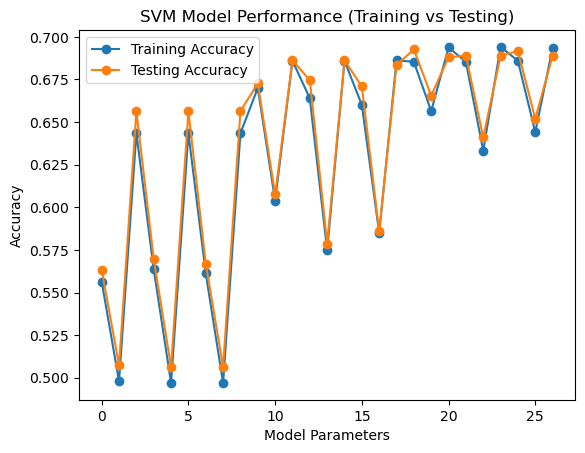

In [221]:
# Plotting the results
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('SVM Model Performance (Training vs Testing)')
ax.legend()

plt.show()

## XGBClassifier

In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1,objective='binary:logistic',seed=123)

xgb.fit(X_train_scaled, y_train2)
print("Accuracy on training set: {:.3f}".format(xgb.score(X_train_scaled, y_train2)))
print("Accuracy on test set: {:.3f}".format(xgb.score(X_test_scaled, y_test2)))

In [ ]:
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('XGBoost Model Performance (Training vs Testing)')
ax.legend()

plt.show()

In [ ]:
param_grid = {'max_depth': [2, 4],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 0.9],
    'colsample_bytree': [0.8, 0.9],
    'reg_alpha': [0.1, 1],
    'reg_lambda': [1, 1.5],
    'n_estimators': [50, 100]}

best_score = 0

train_accuracies = []
test_accuracies = []
best_parameters = {}

for max_depth in param_grid['max_depth']:
    for learning_rate in param_grid['learning_rate']:
        for subsample in param_grid['subsample']:
            for colsample_bytree in param_grid['colsample_bytree']:
                for reg_alpha in param_grid['reg_alpha']:
                    for reg_lambda in param_grid['reg_lambda']:
                        for n_estimators in param_grid['n_estimators']:

                            model = XGBClassifier(max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                colsample_bytree=colsample_bytree,reg_alpha=reg_alpha,reg_lambda=reg_lambda,n_estimators=n_estimators,
                                eval_metric='logloss',random_state=0)
                            
                            model.fit(X_train_scaled, y_train2)
                            train_score = model.score(X_train_scaled, y_train2)
                            train_accuracies.append(train_score)
                            
                            test_score = model.score(X_test_scaled, y_test2)
                            test_accuracies.append(test_score)
                            
                            if test_score > best_score:
                                best_score = test_score
                                best_parameters = {'max_depth': max_depth,'learning_rate': learning_rate,
                                    'subsample': subsample,'colsample_bytree': colsample_bytree,'reg_alpha': reg_alpha,
                                    'reg_lambda': reg_lambda,'n_estimators': n_estimators}

print("Best test score: {:.2f}".format(best_score))
print("Best parameters: {}".format(best_parameters))

In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(max_depth=4,learning_rate=0.1,subsample=0.8,colsample_bytree=0.9,reg_alpha=1,
                    reg_lambda=1.5,n_estimators=100)

xgb.fit(X_train_scaled, y_train2)
print("Accuracy on training set: {:.3f}".format(xgb.score(X_train_scaled, y_train2)))
print("Accuracy on test set: {:.3f}".format(xgb.score(X_test_scaled, y_test2)))

In [ ]:
fig, ax = plt.subplots()

ax.plot(train_accuracies, label="Training Accuracy", marker='o')
ax.plot(test_accuracies, label="Testing Accuracy", marker='o')

ax.set_xlabel('Model Parameters')
ax.set_ylabel('Accuracy')
ax.set_title('XGBoost Model Performance (Training vs Testing)')
ax.legend()

plt.show()

### Model-Based Feature Selection

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
select = SelectFromModel(
RandomForestClassifier(n_estimators=100, random_state=42),
threshold="median")

select.fit(X_train_scaled, y_train2)
X_train_l1 = select.transform(X_train_scaled)
print("X_train.shape: {}".format(X_train_scaled.shape))
print("X_train_l1.shape: {}".format(X_train_l1.shape))

In [ ]:
mask = select.get_support()
# visualize the mask -- black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")

In [ ]:
X_test_l1 = select.transform(X_test_scaled)

# Set the parameters # of neighbors
knn=KNeighborsClassifier(n_neighbors=10)
# Storing the datase, so we can compute neighbors during prediction
score = knn.fit(X_train_l1, y_train2).score(X_test_l1, y_test2)
print("Test score: {:.3f}".format(score))

In [ ]:
NB = GaussianNB()
brn = BernoulliNB()

NB.fit(X_train_l1, y_train2).predict(X_test_l1)

print("GBN Train set score: {:.2f}".format(NB.score(X_train_l1, y_train2)))
print("GBN Test set score: {:.2f}".format(NB.score(X_test_l1, y_test2)))

brn.fit(X_train_l1, y_train2).predict(X_test_l1)
print("BRN Train set score: {:.2f}".format(brn.score(X_train_l1, y_train2)))
print("BRN Test set score: {:.2f}".format(brn.score(X_test_l1, y_test2)))

In [ ]:
tree = DecisionTreeClassifier(max_depth=6, random_state=0)
tree.fit(X_train_l1, y_train2)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train_l1, y_train2)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test_l1, y_test2)))

In [ ]:
rf_clf = RandomForestClassifier()# Default values give higher accuracy in test n_estimators=50, max_depth=1, max_features='sqrt'
rf_clf.fit(X_train_l1, y_train2)
print("Train set score: {:.2f}".format(rf_clf.score(X_train_l1, y_train2)))
print("Test set score: {:.2f}".format(rf_clf.score(X_test_l1, y_test2)))

In [ ]:
gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train_l1, y_train2)
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train_l1, y_train2)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test_l1, y_test2)))

In [ ]:
# SVM transformed not tuning

svc_clf = SVC(kernel='rbf', C=100, gamma=0.1)
svc_clf.fit(X_train_l1, y_train2)
print("Train set score: {:.2f}".format(svc_clf.score(X_train_l1, y_train2)))
print("Test set score: {:.2f}".format(svc_clf.score(X_test_l1, y_test2)))

## Logistic Regression and SVC

In [ ]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(C=50)
logreg.fit(X_train_scaled, y_train2)
print("Test score: {:.2f}".format(logreg.score(X_test_scaled, y_test2)))

In [ ]:
from sklearn.svm import SVC
svc = SVC(kernel='rbf', C=100, gamma=0.0001).fit(X_train_scaled, y_train2)
# evaluate the model
print("Accuracy  SVC on training set: {:.3f}".format(svc.score(X_train_scaled, y_train2)))
print("Accuracy  SVC on test set: {:.3f}".format(svc.score(X_test_scaled, y_test2)))

## Feature Engineering of the model

In [ ]:
#applying Polynomial Expansion to raw data
poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X)
X_poly = poly.transform(X)



# Separating the data into training and testing

X_train3, X_test3, y_train3, y_test3 = train_test_split(X_poly, y, random_state=0)

In [ ]:
#Evaluating accuracy of the model
knn=KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train3, y_train3)
y_pred=knn.predict(X_test3)
accuracy =np.mean(y_pred==y_test3)
print('Test accuracy {:.4f}'.format(accuracy),'(neighbors=10)')

In [ ]:
# Applying polynomial expansion and Transformations to the dataset
# Create a pipeline to include the transfromations and expansions
pipeline = Pipeline(steps=[
    ('preprocessor', ct),
    ('poly', PolynomialFeatures(degree=2, include_bias=False))])

# Split the data
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, random_state=0)

# Fit the transformations in the training data
pipeline.fit(X_train4, y_train4)

# Transform the train and test
X_train_transf = pipeline.named_steps['preprocessor'].transform(X_train4)
X_test_transf = pipeline.named_steps['preprocessor'].transform(X_test4)

#Polynomial expansion
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train_transf)
X_test_poly = poly.transform(X_test_transf)

In [ ]:
pipeline = Pipeline(steps=[
    ('preprocessor', ct),
    ('poly', PolynomialFeatures(degree=2, include_bias=False))])

# Split the data
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, random_state=0)

# Fit the transformations in the training data
pipeline.fit(X_train4, y_train4)


# Transform the training and testing data
X_train_poly = pipeline.transform(X_train4)
X_test_poly = pipeline.transform(X_test4)

In [ ]:
knn=KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train_poly, y_train4)
y_pred=knn.predict(X_test_poly)
accuracy =np.mean(y_pred==y_test4)
print('Test accuracy {:.4f}'.format(accuracy),'(neighbors=10)')

In [ ]:
#Select features from model after applying transformations

select = SelectFromModel(
RandomForestClassifier(n_estimators=100, random_state=42),
threshold="median")

# Fit the feature selector on the training data
select.fit(X_train_poly, y_train4)

# Transform both the training and testing data
X_train_l2 = select.transform(X_train_poly)
X_test_l2 = select.transform(X_test_poly)

print("X_train.shape: {}".format(X_train_poly.shape))
print("X_train_l2.shape: {}".format(X_train_l2.shape))

In [ ]:
X_test_l2 = select.transform(X_test_poly)

# Set the parameters # of neighbors
knn=KNeighborsClassifier(n_neighbors=10)
# Storing the datase, so we can compute neighbors during prediction
score = knn.fit(X_train_l2, y_train4).score(X_test_l2, y_test4)
print("Test score: {:.3f}".format(score))

#Adding interactions and polynomials actually decreases performance slightly

# Visualizations

In [ ]:
#full Dataset
predictors = [col for col in df.columns if col != "Target"]
target = "Target"
num_cols = 4
num_rows = (len(predictors) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)

for idx, column in enumerate(predictors):
    row, col = divmod(idx, num_cols) 
    ax = axes[row, col] if num_rows > 1 else axes[col]

    for target_class in df[target].unique():
        sns.kdeplot(
            data=df[df[target] == target_class],
            x=column,
            label=f"Target = {target_class}",
            ax=ax
        )
    ax.set_title(column)
    ax.legend()

for idx in range(len(predictors), num_rows * num_cols):
    fig.delaxes(axes.flatten()[idx])

plt.show()

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[predictors])

plt.figure(figsize=(8, 6))
sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=df["Target"])
plt.title("PCA Visualization of Classes")

plt.show()

#In this plot It is confirmed that this is a classification problem beacuse the Target is not linearly separable.

In [ ]:
df = pd.read_csv("Values.csv")
variables_to_plot = [col for col in df.columns if col not in ["Target", "Age_at_enroll"]]

fig, axes = plt.subplots(len(variables_to_plot), 1, figsize=(25, len(variables_to_plot) * 5), constrained_layout=True)

if len(variables_to_plot) == 1:
    axes = [axes]

for idx, variable in enumerate(variables_to_plot):
    sns.boxplot(
        data=df,
        x=variable,
        y="Age_at_enroll",
        hue="Target",
        ax=axes[idx],
        palette="Set1",
        width=0.6 
    )
    axes[idx].set_title(f"Boxplot of {variable}", fontsize=14)
    axes[idx].legend(loc="best", title="Target")
    axes[idx].tick_params(axis='x', rotation=90, labelsize=12)  

plt.show()

In [ ]:
variables_to_plot = [col for col in df.columns if col != "Target"]

fig, axes = plt.subplots(len(variables_to_plot), 1, figsize=(20, len(variables_to_plot) * 6), constrained_layout=True)

if len(variables_to_plot) == 1:
    axes = [axes]

for idx, variable in enumerate(variables_to_plot):
    ax = axes[idx]
    # Create barplot
    sns.countplot(data=df, x=variable, hue="Target", ax=ax, palette="Set1",)
    ax.set_title(f"Barplot of {variable} by Target", fontsize=14)
    
    for container in ax.containers:
        ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10)
    
    ax.tick_params(axis='x', rotation=90, labelsize=12)

plt.show()

In [ ]:
categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()

fig, axes = plt.subplots(len(categorical_vars), 1, figsize=(15, len(categorical_vars) * 6), constrained_layout=True)

if len(categorical_vars) == 1:
    axes = [axes]
custom_colors = ['crimson', 'steelblue', 'mediumseagreen']
for idx, variable in enumerate(categorical_vars):
    ax = axes[idx]
    
    category_counts = df.groupby([variable, 'Target']).size().unstack(fill_value=0)
    category_percentages = category_counts.div(category_counts.sum(axis=1), axis=0) * 100
    
    category_percentages.plot(kind='bar', stacked=True, ax=ax, color=custom_colors, width=0.8)
    
    for p in ax.patches:
        height = p.get_height()
        width = p.get_width()
        x = p.get_x() + width / 2
        y = p.get_y() + height / 2

        percentage = f'{height:.1f}%'
        ax.text(x, y, percentage, ha='center', va='center', fontsize=10, color='black')

    ax.set_title(f"Percentage Distribution of Target by {variable}", fontsize=14)
    ax.set_ylabel('Percentage', fontsize=12)
    ax.set_xlabel(variable, fontsize=12)
    ax.tick_params(axis='x', rotation=90, labelsize=12)
    ax.legend(title='Target', fontsize=12)

plt.show()

In [ ]:
# Count the occurrences of each class in the 'Target' column
target_counts = df['Target'].value_counts()
custom_colors = ['crimson', 'steelblue', 'mediumseagreen']
# Set up the figure for two pie charts side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 8), constrained_layout=True)

# Pie chart for percentage distribution of the Target variable
axes[0].pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=90, colors=custom_colors)
axes[0].set_title('Target Class Distribution (Percentage)', fontsize=14)

# Pie chart for count distribution of the Target variable
axes[1].pie(target_counts, labels=target_counts.index, autopct='%1.0f', startangle=90, colors=custom_colors)
axes[1].set_title('Target Class Distribution (Count)', fontsize=14)

# Show the plot
plt.show()

# Visualizations

C:\Users\jhony\AppData\Local\Temp\ipykernel_48904\935798889.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
C:\Users\jhony\AppData\Local\Temp\ipykernel_48904\935798889.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
C:\Users\jhony\AppData\Local\Temp\ipykernel_48904\935798889.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


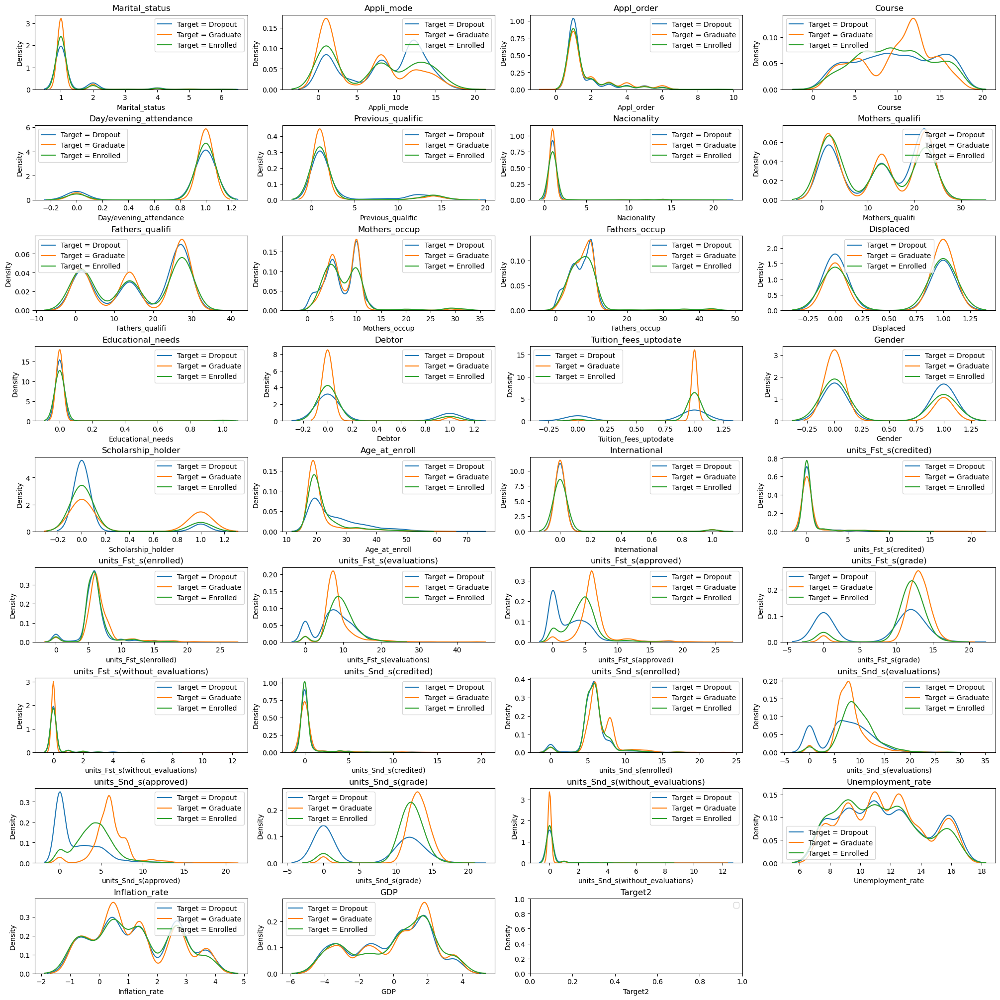

In [222]:
#full Dataset
predictors = [col for col in df.columns if col != "Target"]
target = "Target"
num_cols = 4
num_rows = (len(predictors) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)

for idx, column in enumerate(predictors):
    row, col = divmod(idx, num_cols) 
    ax = axes[row, col] if num_rows > 1 else axes[col]

    for target_class in df[target].unique():
        sns.kdeplot(
            data=df[df[target] == target_class],
            x=column,
            label=f"Target = {target_class}",
            ax=ax
        )
    ax.set_title(column)
    ax.legend()

for idx in range(len(predictors), num_rows * num_cols):
    fig.delaxes(axes.flatten()[idx])

plt.show()


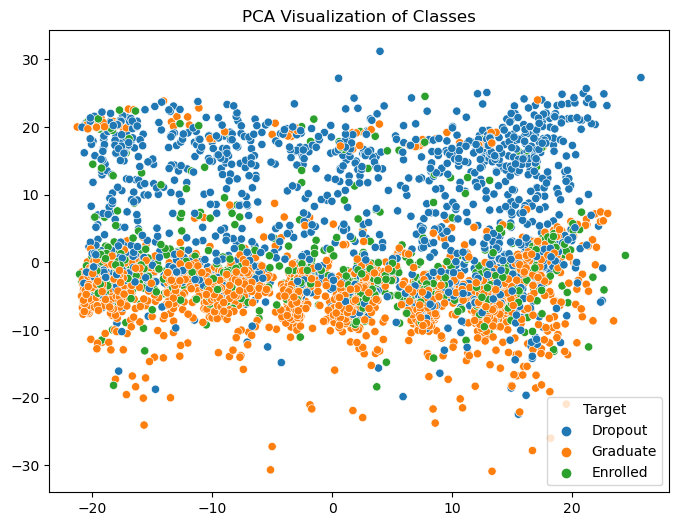

In [223]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[predictors])

plt.figure(figsize=(8, 6))
sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=df["Target"])
plt.title("PCA Visualization of Classes")

plt.show()

#In this plot It is confirmed that this is a classification problem beacuse the Target is not linearly separable.

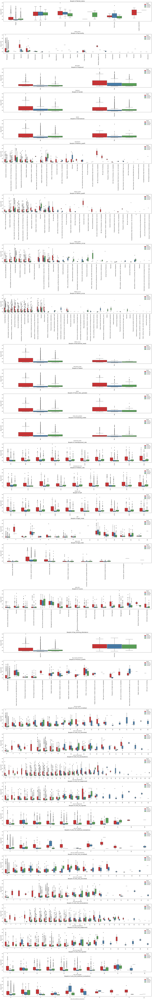

In [224]:
df = pd.read_csv("Values.csv")
variables_to_plot = [col for col in df.columns if col not in ["Target", "Age_at_enroll"]]

fig, axes = plt.subplots(len(variables_to_plot), 1, figsize=(25, len(variables_to_plot) * 5), constrained_layout=True)

if len(variables_to_plot) == 1:
    axes = [axes]

for idx, variable in enumerate(variables_to_plot):
    sns.boxplot(
        data=df,
        x=variable,
        y="Age_at_enroll",
        hue="Target",
        ax=axes[idx],
        palette="Set1",
        width=0.6 
    )
    axes[idx].set_title(f"Boxplot of {variable}", fontsize=14)
    axes[idx].legend(loc="best", title="Target")
    axes[idx].tick_params(axis='x', rotation=90, labelsize=12)  

plt.show()

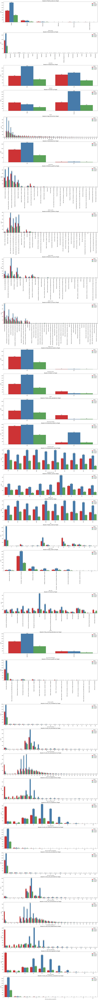

In [225]:
variables_to_plot = [col for col in df.columns if col != "Target"]

fig, axes = plt.subplots(len(variables_to_plot), 1, figsize=(20, len(variables_to_plot) * 6), constrained_layout=True)

if len(variables_to_plot) == 1:
    axes = [axes]

for idx, variable in enumerate(variables_to_plot):
    ax = axes[idx]
    # Create barplot
    sns.countplot(data=df, x=variable, hue="Target", ax=ax, palette="Set1",)
    ax.set_title(f"Barplot of {variable} by Target", fontsize=14)
    
    for container in ax.containers:
        ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10)
    
    ax.tick_params(axis='x', rotation=90, labelsize=12)

plt.show()

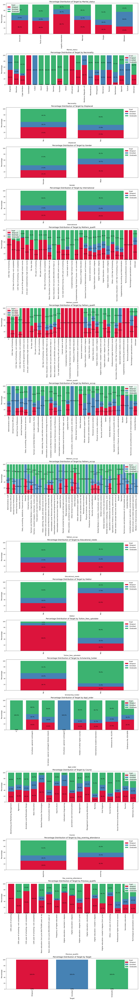

In [226]:
categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()

fig, axes = plt.subplots(len(categorical_vars), 1, figsize=(15, len(categorical_vars) * 6), constrained_layout=True)

if len(categorical_vars) == 1:
    axes = [axes]
custom_colors = ['crimson', 'steelblue', 'mediumseagreen']
for idx, variable in enumerate(categorical_vars):
    ax = axes[idx]
    
    category_counts = df.groupby([variable, 'Target']).size().unstack(fill_value=0)
    category_percentages = category_counts.div(category_counts.sum(axis=1), axis=0) * 100
    
    category_percentages.plot(kind='bar', stacked=True, ax=ax, color=custom_colors, width=0.8)
    
    for p in ax.patches:
        height = p.get_height()
        width = p.get_width()
        x = p.get_x() + width / 2
        y = p.get_y() + height / 2

        percentage = f'{height:.1f}%'
        ax.text(x, y, percentage, ha='center', va='center', fontsize=10, color='black')

    ax.set_title(f"Percentage Distribution of Target by {variable}", fontsize=14)
    ax.set_ylabel('Percentage', fontsize=12)
    ax.set_xlabel(variable, fontsize=12)
    ax.tick_params(axis='x', rotation=90, labelsize=12)
    ax.legend(title='Target', fontsize=12)

plt.show()

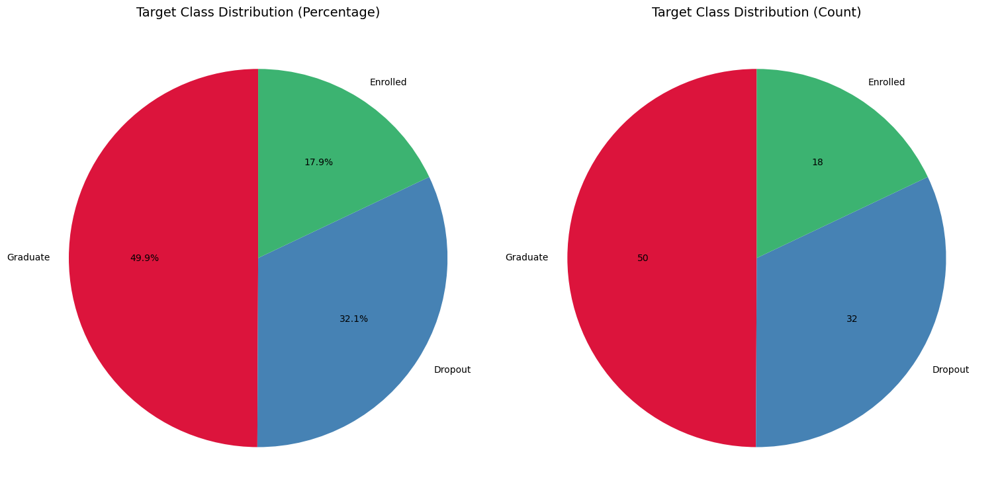

In [227]:
# Count the occurrences of each class in the 'Target' column
target_counts = df['Target'].value_counts()
custom_colors = ['crimson', 'steelblue', 'mediumseagreen']
# Set up the figure for two pie charts side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 8), constrained_layout=True)

# Pie chart for percentage distribution of the Target variable
axes[0].pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=90, colors=custom_colors)
axes[0].set_title('Target Class Distribution (Percentage)', fontsize=14)

# Pie chart for count distribution of the Target variable
axes[1].pie(target_counts, labels=target_counts.index, autopct='%1.0f', startangle=90, colors=custom_colors)
axes[1].set_title('Target Class Distribution (Count)', fontsize=14)

# Show the plot
plt.show()